In [34]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
# Load the dataset

df=pd.read_csv('./content/OnlineNewsPopularity-Train.csv')
df_test=pd.read_csv('./content/OnlineNewsPopularity-Test.csv')

# data visualization/preprocessing

In [35]:
FS = 15 # font size

In [36]:
# Display the first few rows of the dataframe
print(df.head())

                                                 url   timedelta  \
0  http://mashable.com/2013/01/07/amazon-instant-...       731.0   
1  http://mashable.com/2013/01/07/ap-samsung-spon...       731.0   
2  http://mashable.com/2013/01/07/apple-40-billio...       731.0   
3  http://mashable.com/2013/01/07/astronaut-notre...       731.0   
4   http://mashable.com/2013/01/07/att-u-verse-apps/       731.0   

    n_tokens_title   n_tokens_content   n_unique_tokens   n_non_stop_words  \
0             12.0              219.0          0.663594                1.0   
1              9.0              255.0          0.604743                1.0   
2              9.0              211.0          0.575130                1.0   
3              9.0              531.0          0.503788                1.0   
4             13.0             1072.0          0.415646                1.0   

    n_non_stop_unique_tokens   num_hrefs   num_self_hrefs   num_imgs  ...  \
0                   0.815385         4.0     

In [37]:
# Basic descriptive statistics
print(df.describe())


          timedelta  n_tokens_title  n_tokens_content  n_unique_tokens  \
count  29999.000000    29999.000000      29999.000000     29999.000000   
mean     441.320677       10.179939        544.018367         0.544578   
std      170.503893        2.046436        471.338932         0.119780   
min      161.000000        2.000000          0.000000         0.000000   
25%      287.000000        9.000000        244.000000         0.477452   
50%      442.000000       10.000000        401.000000         0.546774   
75%      590.000000       12.000000        703.000000         0.616279   
max      731.000000       19.000000       8474.000000         1.000000   

       n_non_stop_words  n_non_stop_unique_tokens     num_hrefs  \
count      29999.000000              29999.000000  29999.000000   
mean           0.988133                  0.687669     11.194040   
std            0.108290                  0.126818     11.328454   
min            0.000000                  0.000000      0.000000  

In [38]:
print(df.columns)
# Strip leading spaces from column names
df.columns = df.columns.str.strip()
df_test.columns = df_test.columns.str.strip()

Index(['url', ' timedelta', ' n_tokens_title', ' n_tokens_content',
       ' n_unique_tokens', ' n_non_stop_words', ' n_non_stop_unique_tokens',
       ' num_hrefs', ' num_self_hrefs', ' num_imgs', ' num_videos',
       ' average_token_length', ' num_keywords', ' data_channel_is_lifestyle',
       ' data_channel_is_entertainment', ' data_channel_is_bus',
       ' data_channel_is_socmed', ' data_channel_is_tech',
       ' data_channel_is_world', ' kw_min_min', ' kw_max_min', ' kw_avg_min',
       ' kw_min_max', ' kw_max_max', ' kw_avg_max', ' kw_min_avg',
       ' kw_max_avg', ' kw_avg_avg', ' self_reference_min_shares',
       ' self_reference_max_shares', ' self_reference_avg_sharess',
       ' weekday_is_monday', ' weekday_is_tuesday', ' weekday_is_wednesday',
       ' weekday_is_thursday', ' weekday_is_friday', ' weekday_is_saturday',
       ' weekday_is_sunday', ' is_weekend', ' LDA_00', ' LDA_01', ' LDA_02',
       ' LDA_03', ' LDA_04', ' global_subjectivity',
       ' global_sent

In [39]:
df.drop("url", axis=1)

,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
0,731.0,12.0,219.0,0.663594,1.0,0.815385,4.0,2.0,1.0,0.0,...,0.100000,0.70,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,593
1,731.0,9.0,255.0,0.604743,1.0,0.791946,3.0,1.0,1.0,0.0,...,0.033333,0.70,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,711
2,731.0,9.0,211.0,0.575130,1.0,0.663866,3.0,1.0,1.0,0.0,...,0.100000,1.00,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,1500
3,731.0,9.0,531.0,0.503788,1.0,0.665635,9.0,0.0,1.0,0.0,...,0.136364,0.80,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,1200
4,731.0,13.0,1072.0,0.415646,1.0,0.540890,19.0,19.0,20.0,0.0,...,0.033333,1.00,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,505
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29994,161.0,8.0,1256.0,0.437348,1.0,0.665718,23.0,4.0,2.0,0.0,...,0.033333,1.00,-0.392262,-1.000,-0.050000,0.250000,0.250000,0.250000,0.250000,4600
29995,161.0,8.0,184.0,0.703911,1.0,0.867257,5.0,1.0,0.0,2.0,...,0.100000,0.80,-0.379167,-0.700,-0.150000,0.000000,0.000000,0.500000,0.000000,871
29996,161.0,13.0,289.0,0.644599,1.0,0.839286,1.0,1.0,0.0,1.0,...,0.062500,0.90,-0.271944,-0.600,-0.155556,0.000000,0.000000,0.500000,0.000000,422
29997,161.0,12.0,676.0,0.469539,1.0,0.629630,4.0,3.0,1.0,0.0,...,0.050000,0.60,-0.224554,-0.500,-0.071429,0.000000,0.000000,0.500000,0.000000,874


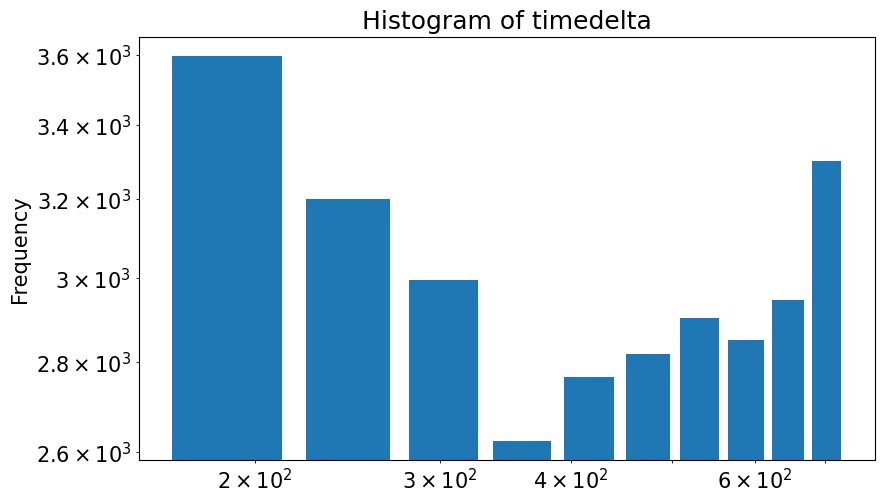

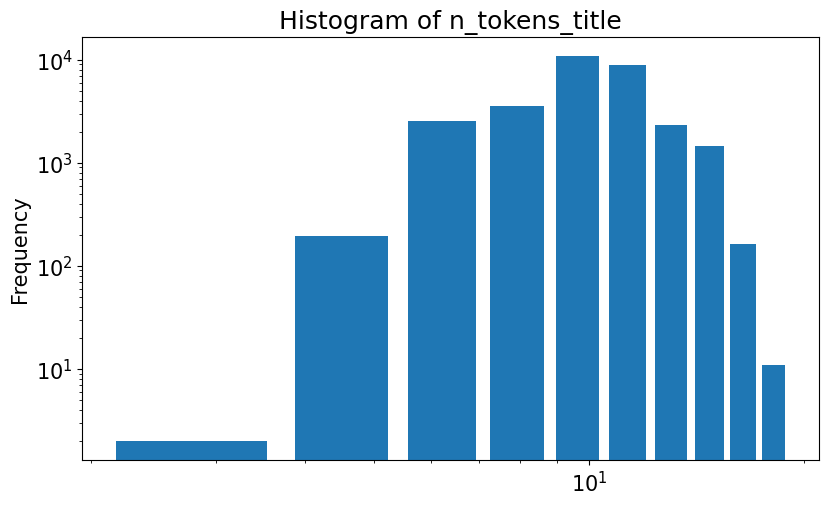

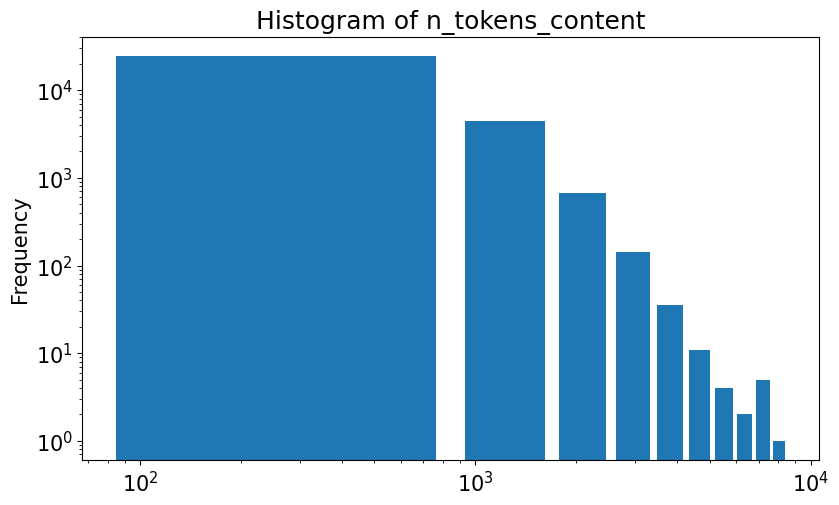

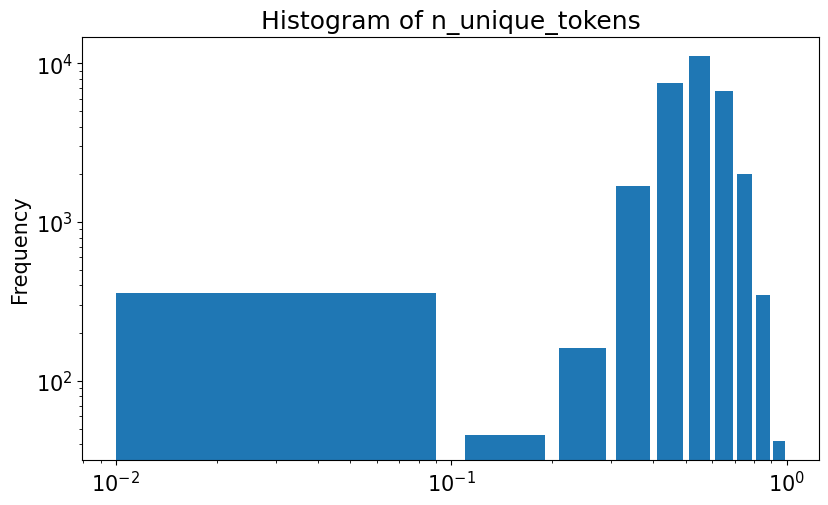

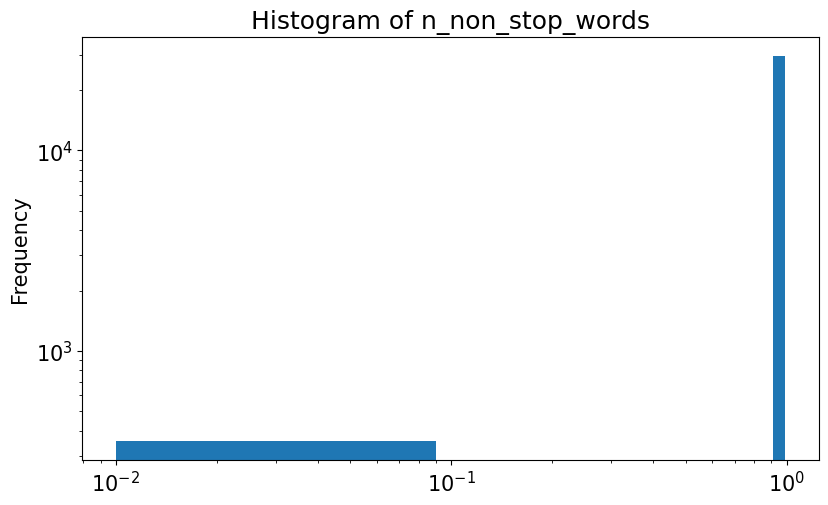

...

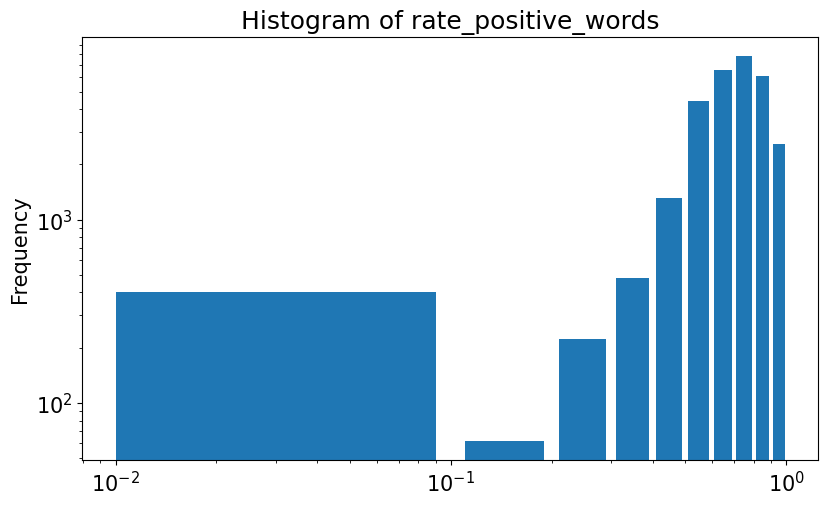

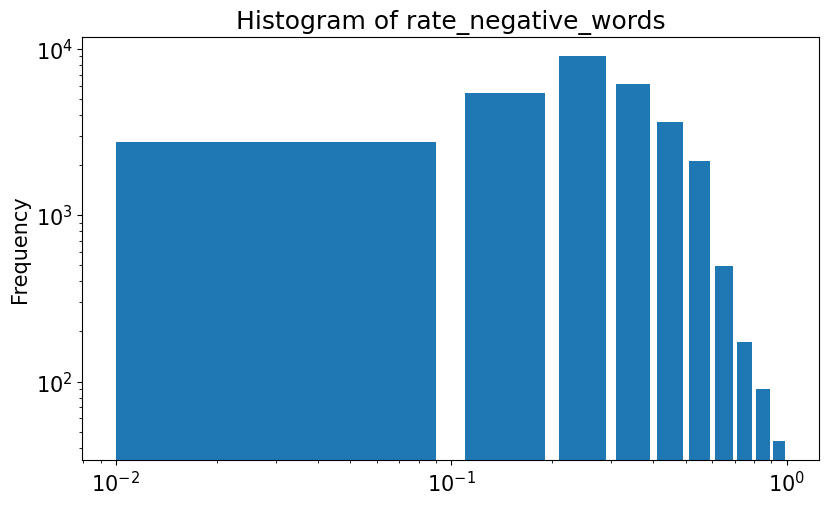

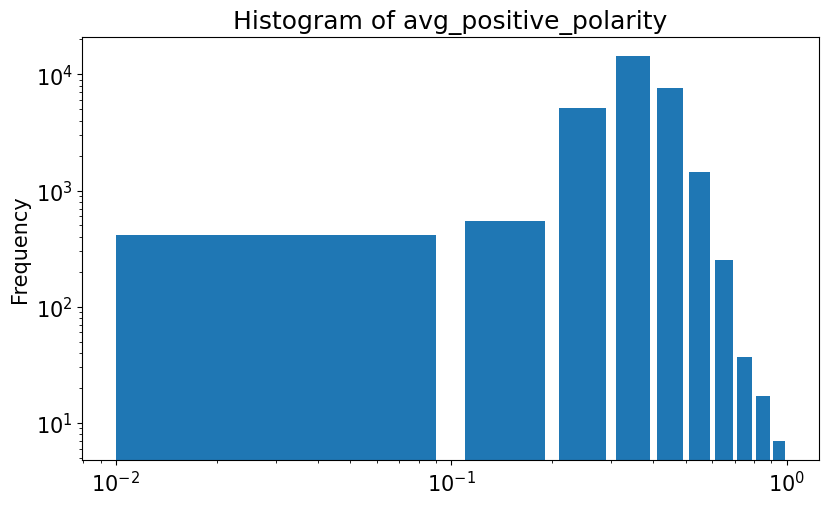

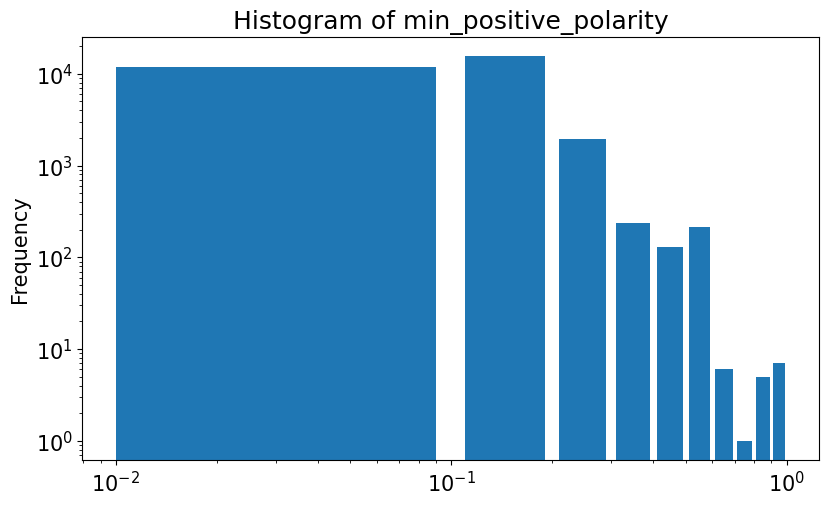

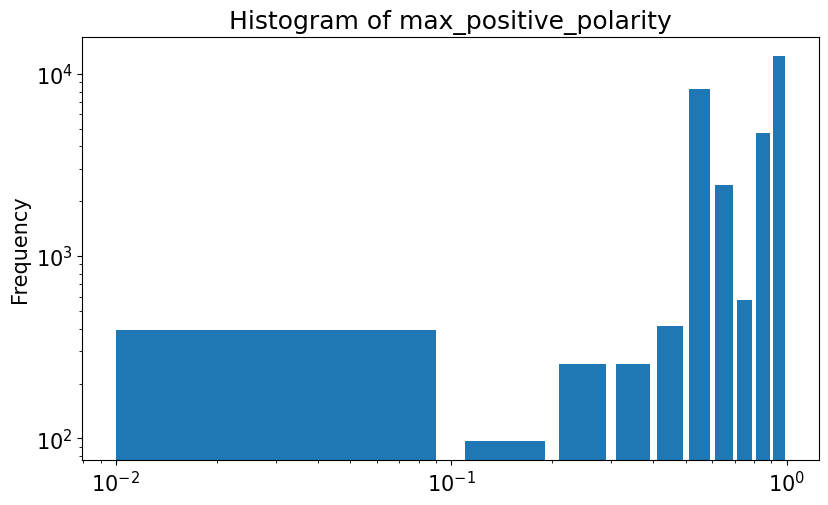

C:\Users\Hasco\AppData\Local\Temp\ipykernel_50656\1590224713.py:8: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.xscale('log')


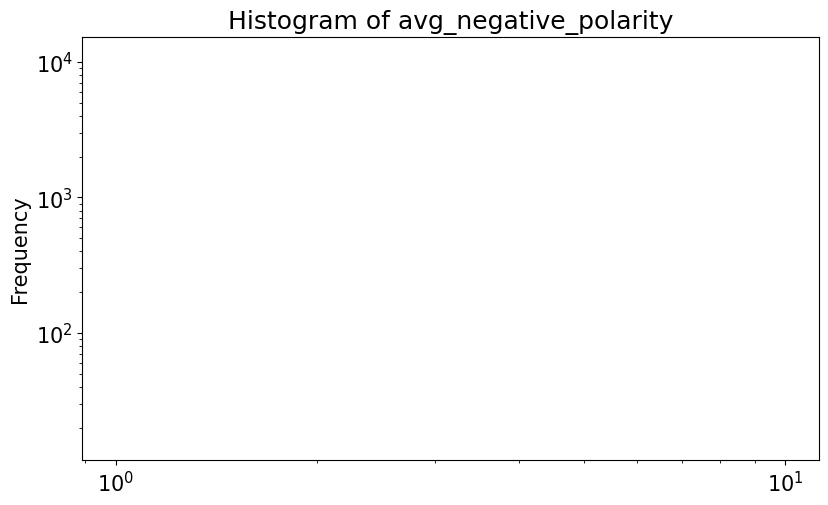

C:\Users\Hasco\AppData\Local\Temp\ipykernel_50656\1590224713.py:8: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.xscale('log')


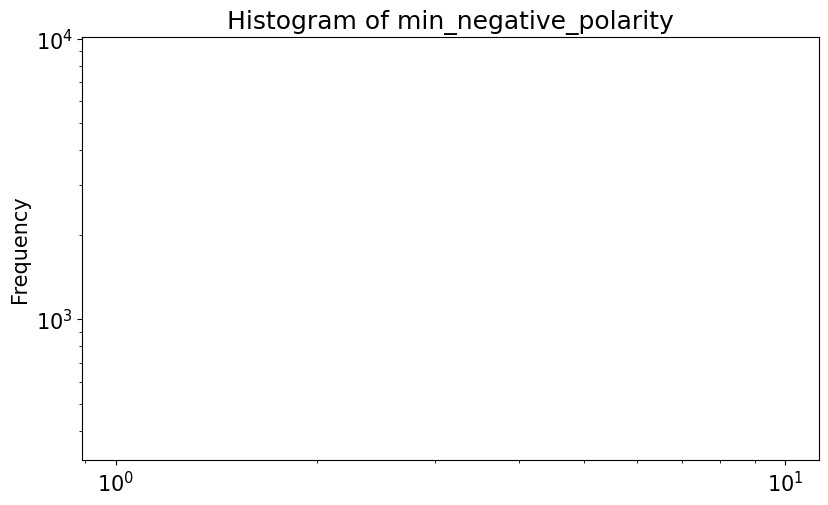

C:\Users\Hasco\AppData\Local\Temp\ipykernel_50656\1590224713.py:8: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.xscale('log')


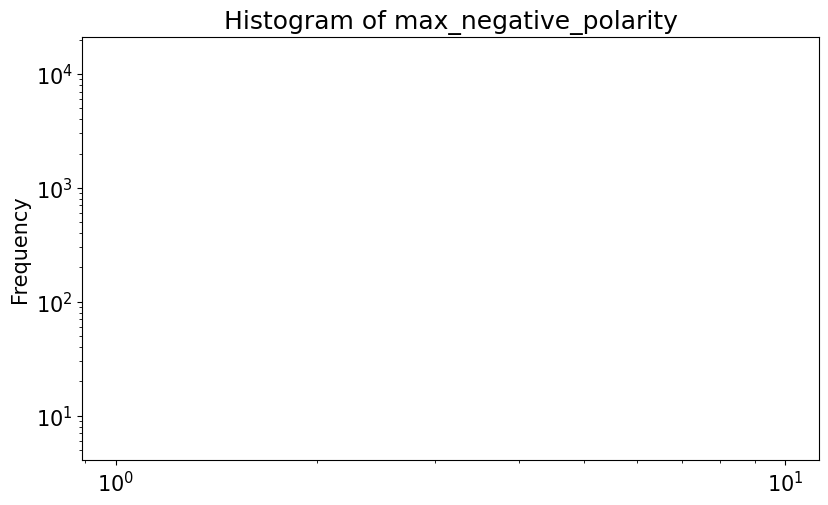

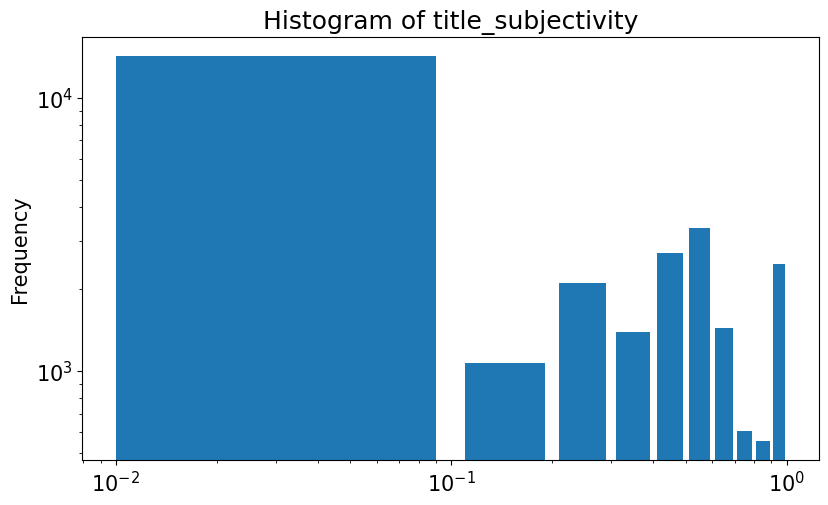

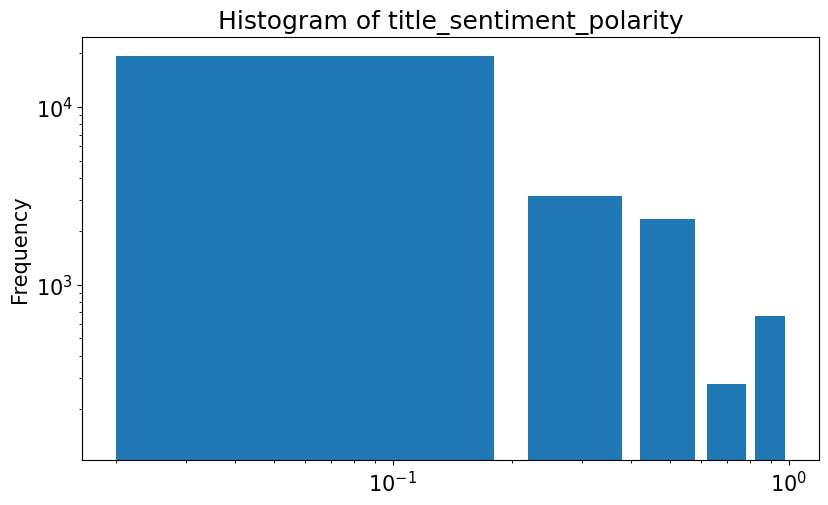

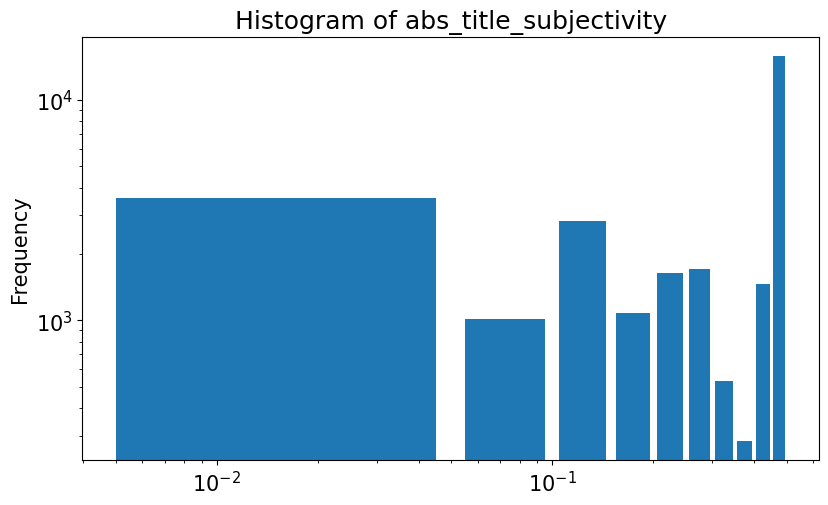

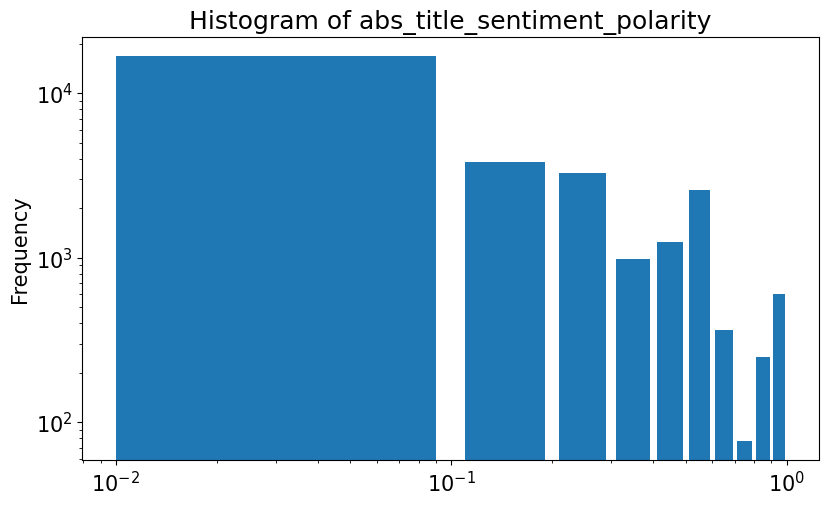

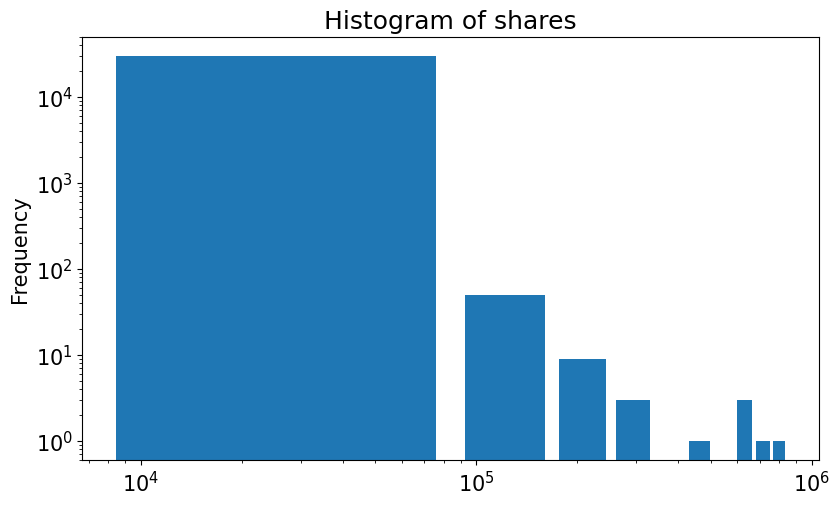

In [40]:
corr_df = df.drop("url", axis=1)
for column in corr_df:
    plt.figure()
    plt.rcParams['font.size'] = FS
    corr_df[column].plot(kind='hist', logy=True, rwidth=0.8)
    plt.title(f'Histogram of {column}')
    plt.yscale('log')
    plt.xscale('log')
    plt.show()
    plt.close()

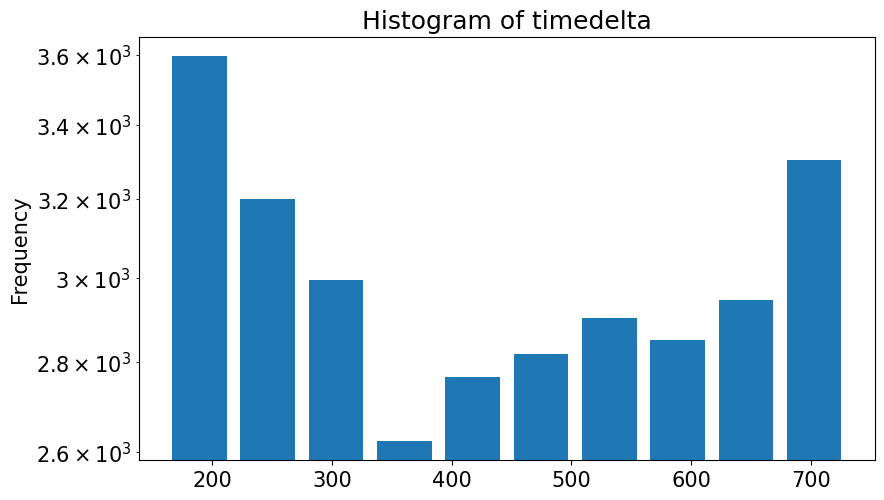

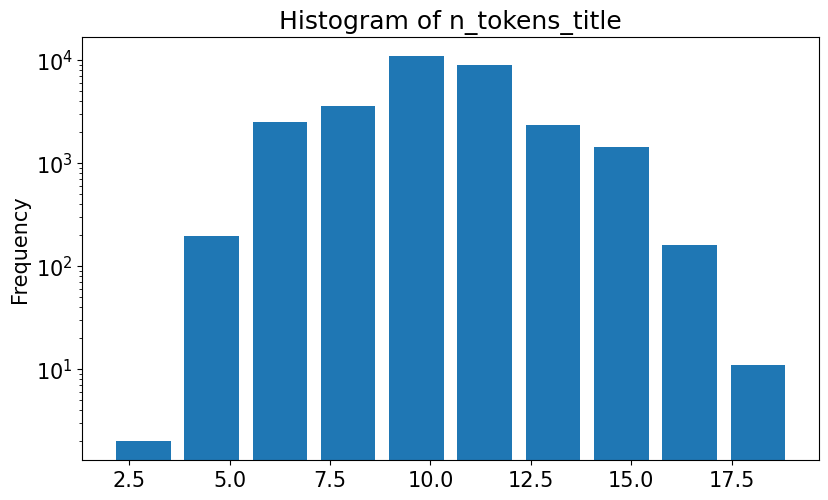

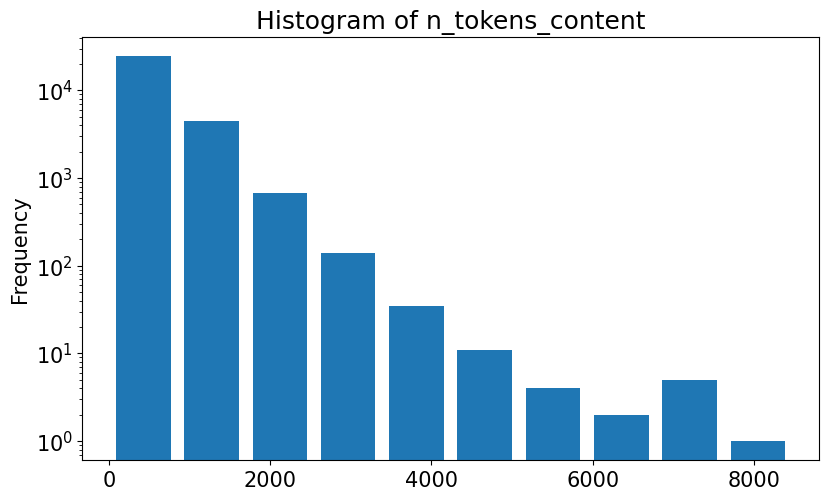

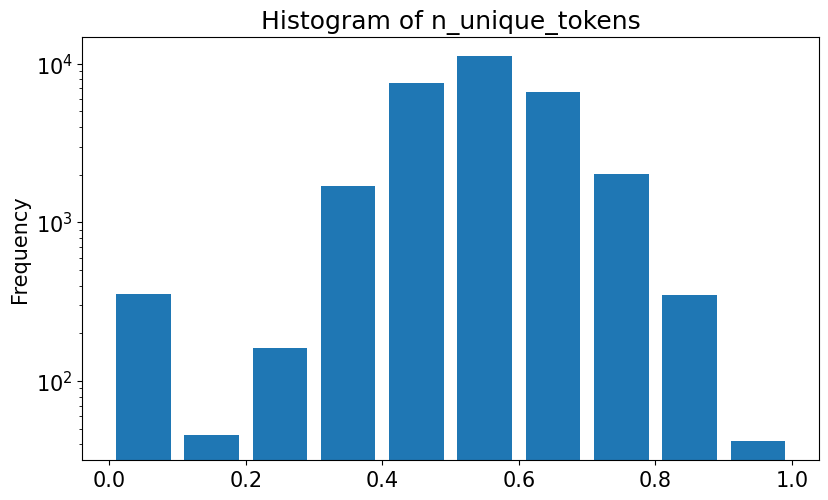

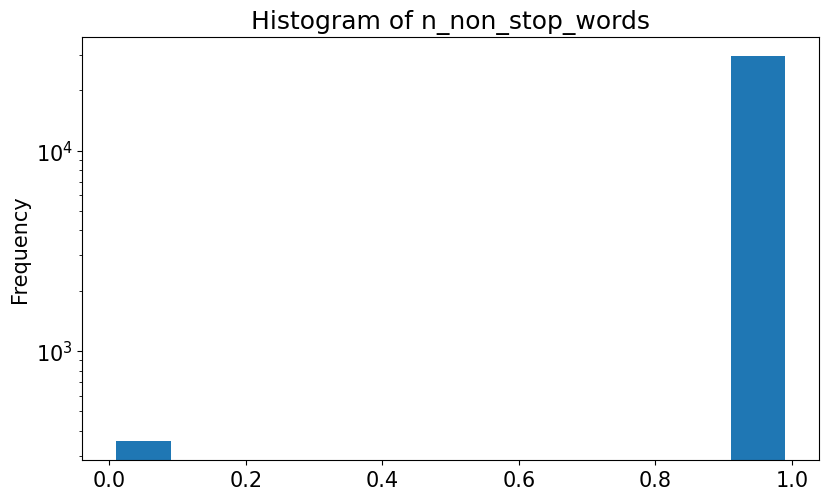

...

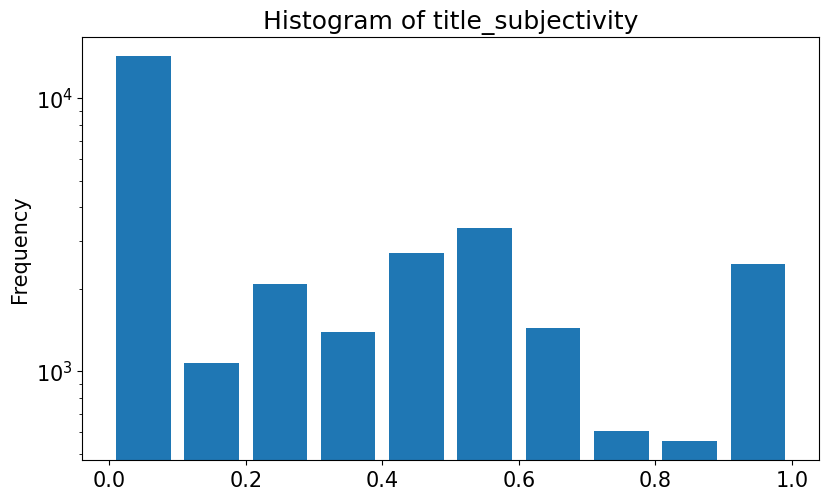

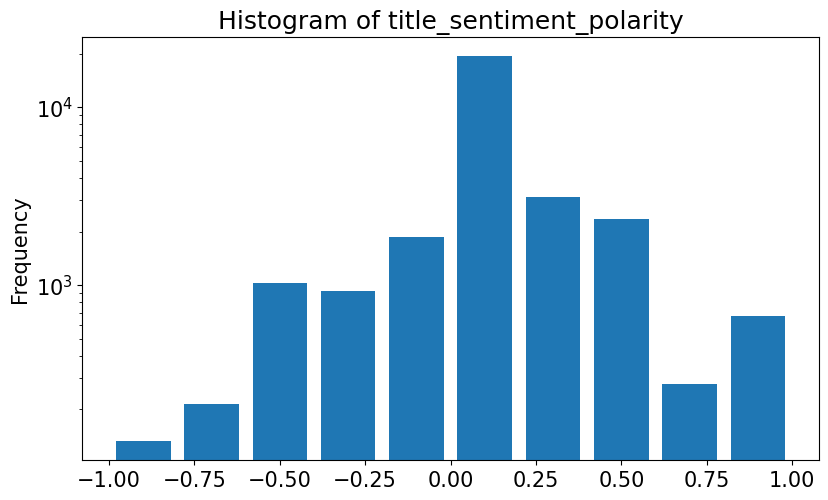

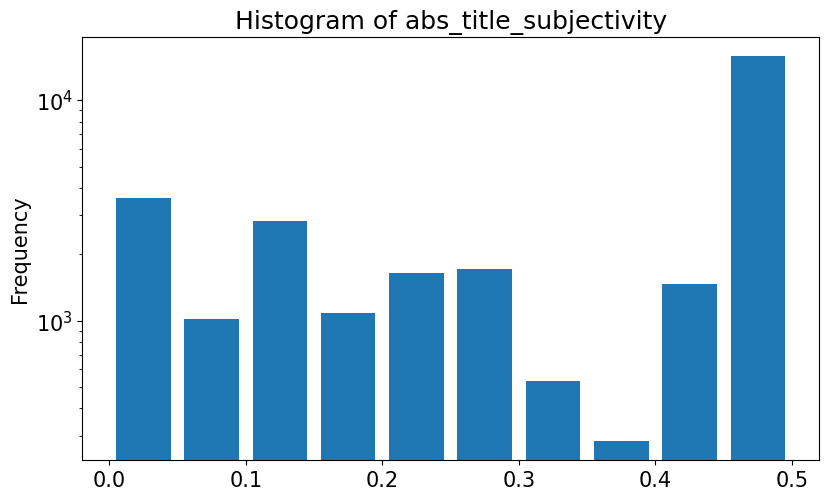

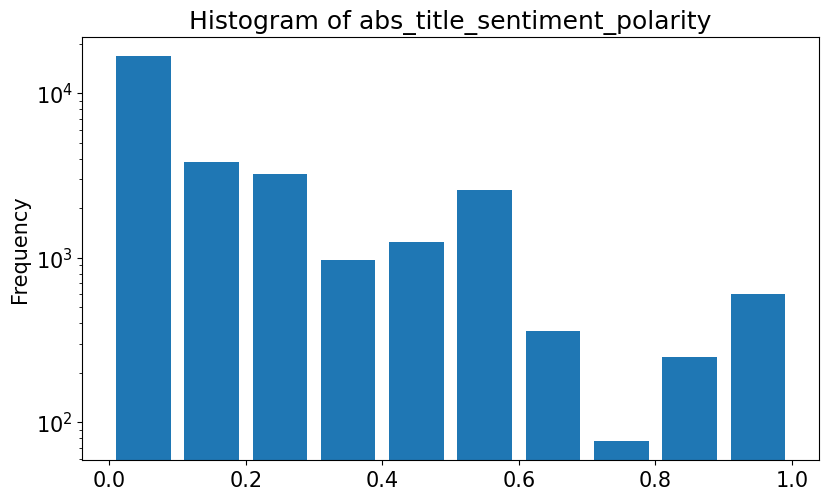

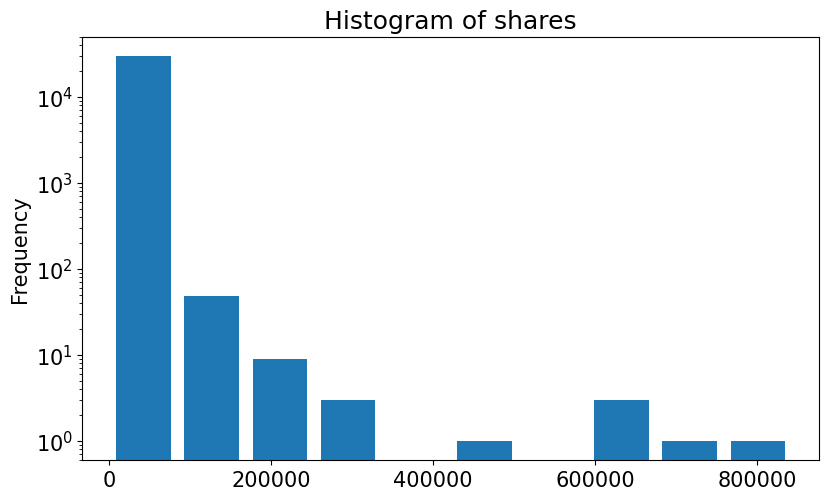

In [41]:
corr_df = df.drop("url", axis=1)
for column in corr_df:
    plt.figure()
    plt.rcParams['font.size'] = FS
    corr_df[column].plot(kind='hist', logy=True, rwidth=0.8)
    plt.title(f'Histogram of {column}')
    plt.show()
    plt.close()

In [42]:
numeric_df = df.select_dtypes(include=[np.number])

# Compute the correlation matrix
correlation_matrix = numeric_df.corr()

# Extract correlations relative to the 'shares' column and sort them
target_correlation = correlation_matrix['shares'].sort_values(ascending=False)

# Print the correlations with the number of shares
print("Correlation with the number of shares:")
print(target_correlation)

Correlation with the number of shares:
shares                           1.000000
kw_avg_avg                       0.104109
LDA_03                           0.078857
self_reference_min_shares        0.060705
kw_max_avg                       0.059931
self_reference_avg_sharess       0.059898
global_subjectivity              0.050939
num_hrefs                        0.050801
self_reference_max_shares        0.048577
kw_avg_max                       0.045039
num_imgs                         0.038187
kw_min_avg                       0.037563
kw_max_min                       0.029836
kw_avg_min                       0.029497
num_videos                       0.028558
abs_title_sentiment_polarity     0.027700
avg_positive_polarity            0.024911
max_positive_polarity            0.022808
title_subjectivity               0.022521
weekday_is_saturday              0.018844
is_weekend                       0.018583
global_rate_negative_words       0.017214
num_keywords                     0.01

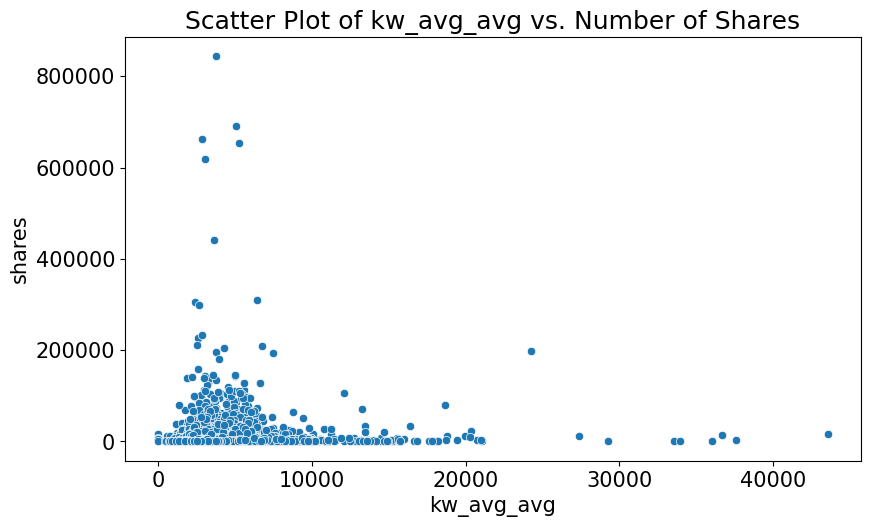

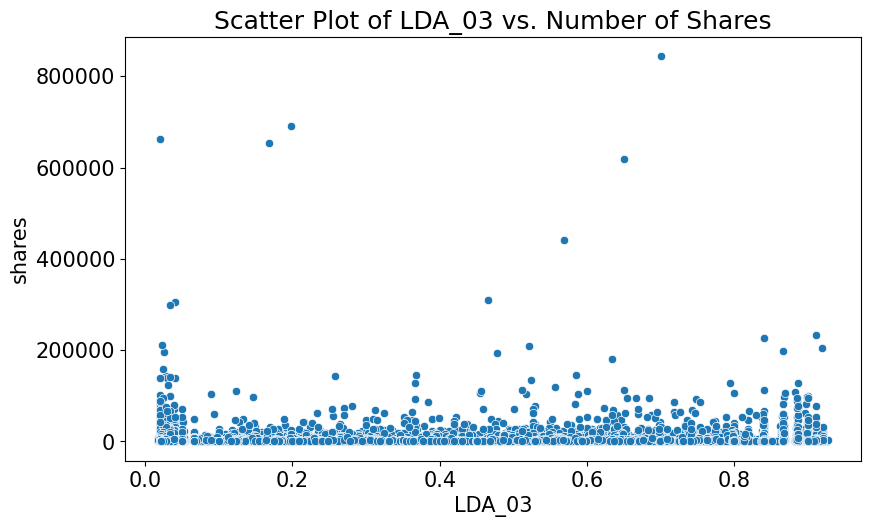

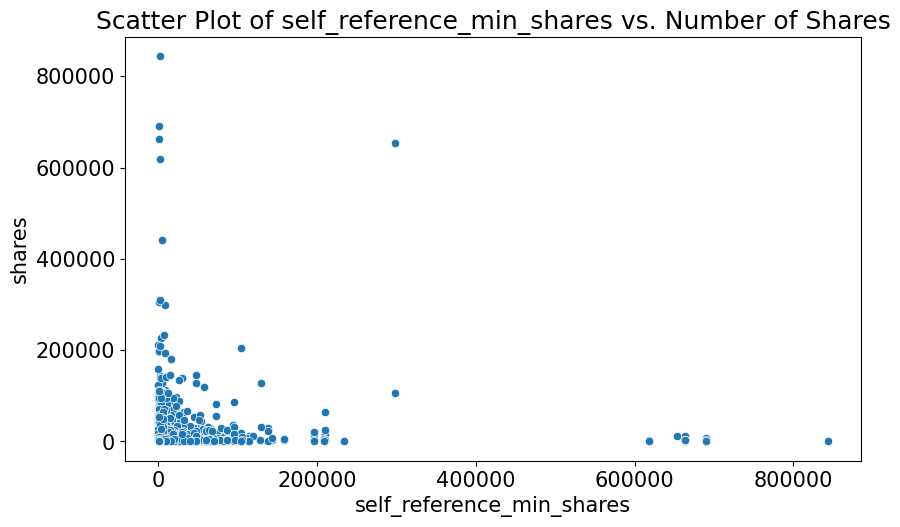

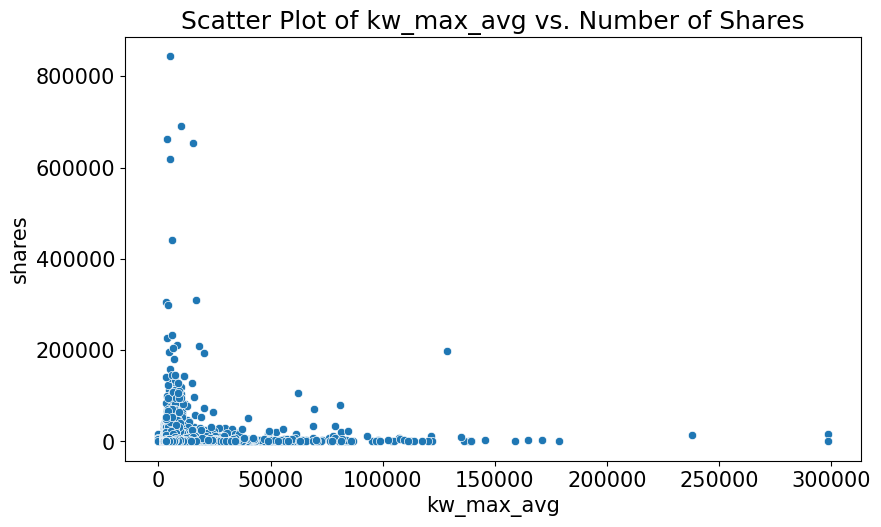

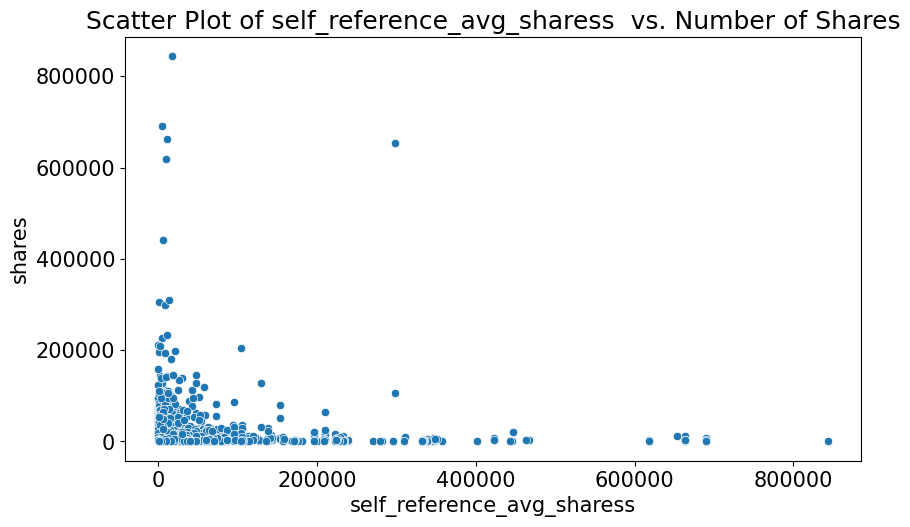

In [43]:
#kw_avg_avg ,LDA_03  ,self_reference_min_shares , kw_max_avg  ,self_reference_avg_sharess
#scatter plots for finding correlations
#kw_avg_avg  vs. Number of Shares
sns.scatterplot(data=df, x='kw_avg_avg', y='shares')
plt.title('Scatter Plot of kw_avg_avg vs. Number of Shares')
plt.show()
#LDA_03 vs. Number of Shares
sns.scatterplot(data=df, x='LDA_03', y='shares')
plt.title('Scatter Plot of LDA_03 vs. Number of Shares')
plt.show()
#self_reference_min_shares vs. Number of Shares
sns.scatterplot(data=df, x='self_reference_min_shares', y='shares')
plt.title('Scatter Plot of self_reference_min_shares vs. Number of Shares')
plt.show()
#kw_max_avg vs. Number of Shares'
sns.scatterplot(data=df, x='kw_max_avg', y='shares')
plt.title('Scatter Plot of kw_max_avg vs. Number of Shares')
plt.show()
#self_reference_avg_sharess  vs. Number of Shares
sns.scatterplot(data=df, x='self_reference_avg_sharess', y='shares')
plt.title('Scatter Plot of self_reference_avg_sharess  vs. Number of Shares')
plt.show()

## **the relationships between the features and the nb of shares are clearly nonlinear therefore we are going to use the spearman correlation**


Highly correlated columns: Index(['kw_max_avg', 'kw_avg_avg', 'self_reference_min_shares',
       'self_reference_max_shares', 'self_reference_avg_sharess', 'is_weekend',
       'shares'],
      dtype='object')
Filtered correlated columns: ['kw_max_avg', 'kw_avg_avg', 'self_reference_min_shares', 'self_reference_max_shares', 'self_reference_avg_sharess', 'is_weekend']


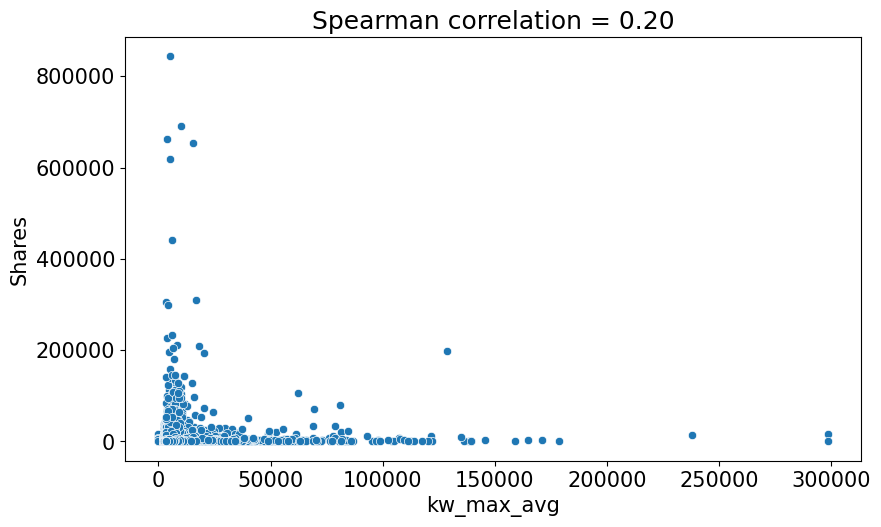

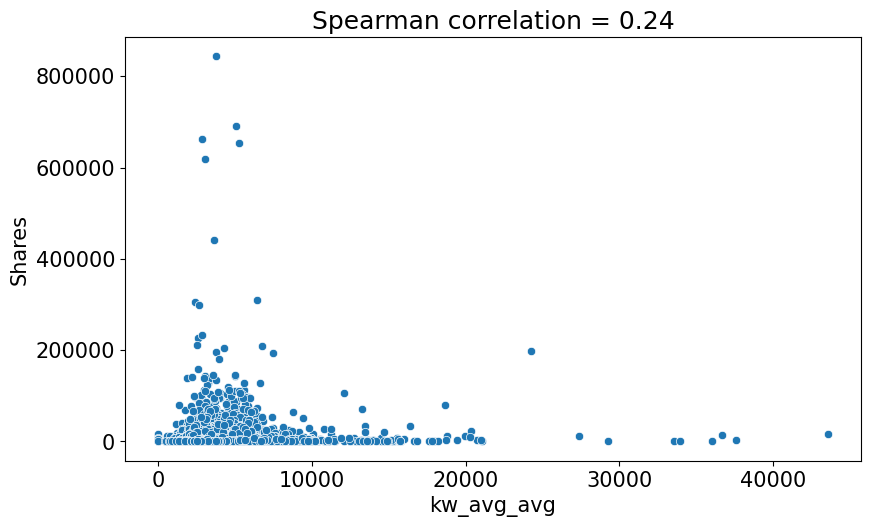

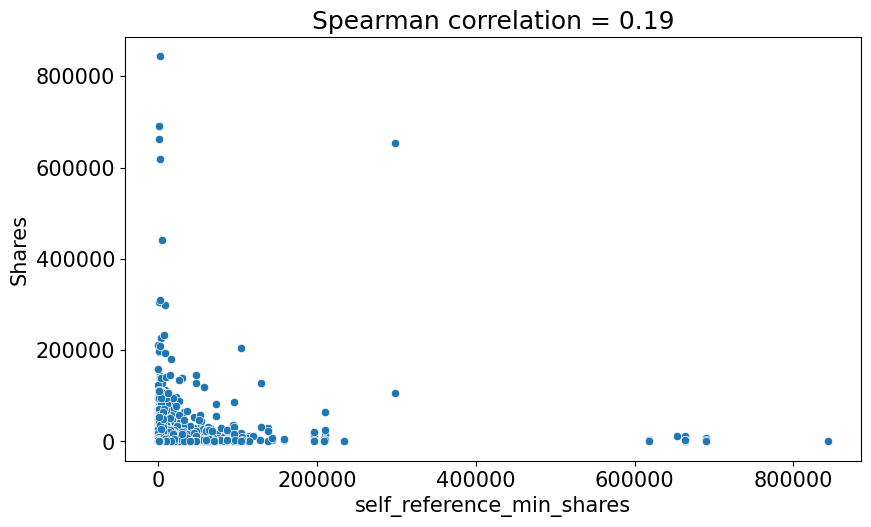

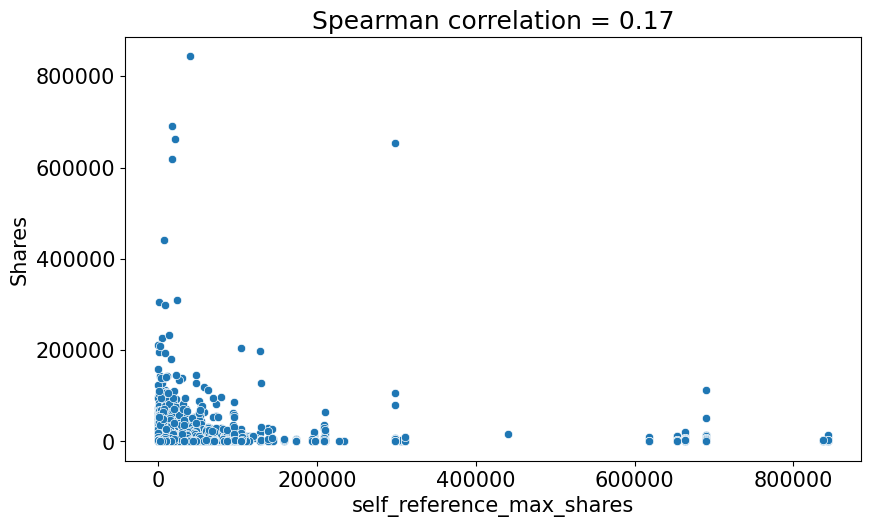

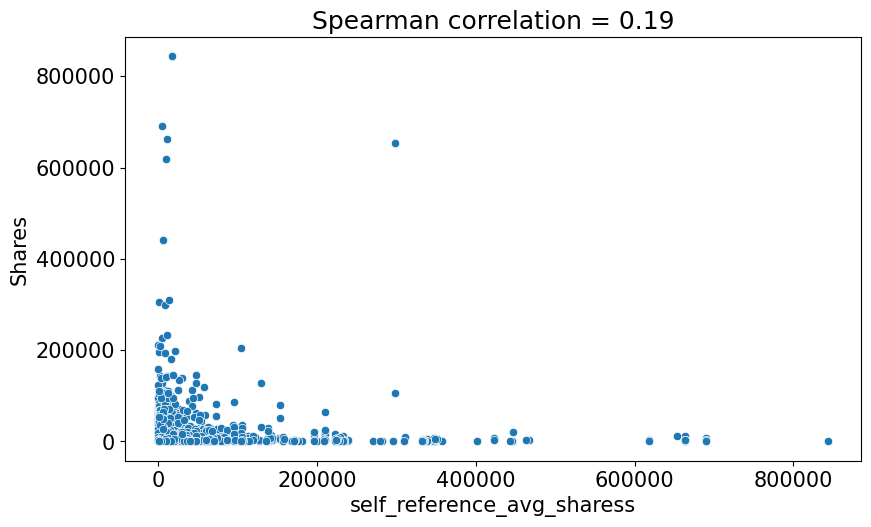

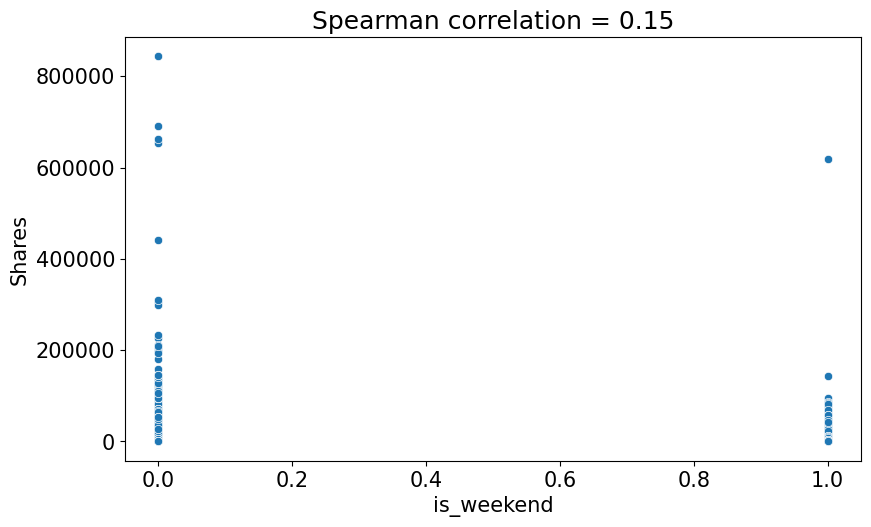

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate correlation
dfnu = df.drop("url", axis=1)
correlation = dfnu.corr(method="spearman")

# Use a high correlation threshold
threshold = 0.15

# Get the highly correlated columns with the 'shares' column
highly_correlated = correlation[abs(correlation['shares']) > threshold]['shares'].index
print("Highly correlated columns:", highly_correlated)

# Remove 'shares' from highly_correlated, if present
highly_correlated = [col for col in highly_correlated if col != 'shares']
print("Filtered correlated columns:", highly_correlated)

# Set plot parameters
FS = 15  # Font size
plt.rcParams['font.size'] = FS
plt.rcParams["figure.figsize"] = (9.5, 5.5)

# Create a scatter plot for each highly correlated column with 'shares'
for column in highly_correlated:
    sns.scatterplot(data=dfnu, x=column, y='shares')
    plt.xlabel(column)
    plt.ylabel("Shares")
    plt.title(f"Spearman correlation = {correlation.loc[column, 'shares']:.2f}")
    # Show the plot
    plt.show()
    plt.close()


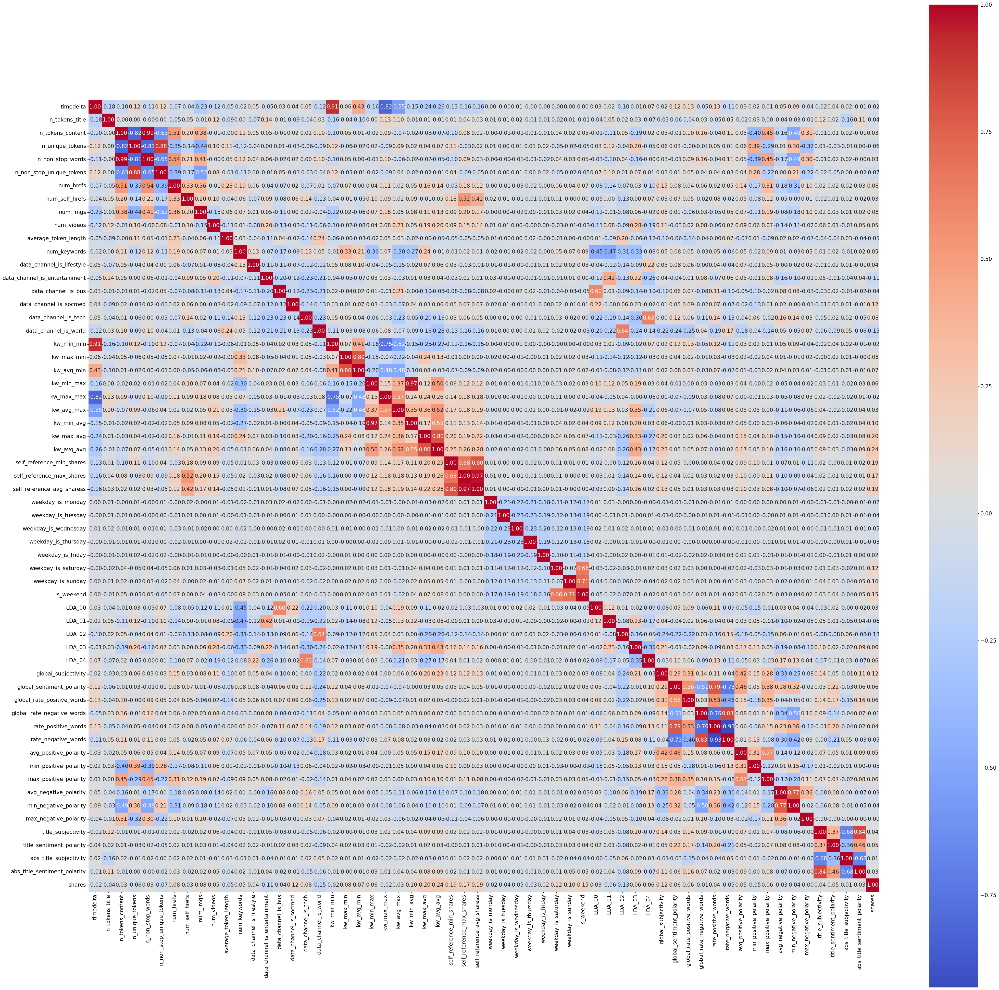

In [45]:
import matplotlib.pyplot as plt
import seaborn as sns

corr_df = df.drop("url", axis=1)

# Calculate the correlation matrix
corr_matrix = corr_df.corr(method="spearman") # pearson

# Set the threshold for displaying correlations
threshold = 0

# Create a mask to display only correlations above a certain absolute value
mask = corr_matrix.abs() > threshold

# Increase the figure size for better readability
plt.figure(figsize=(50, 50))

# Plot the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_matrix[mask], annot=True, fmt=".2f", cmap='coolwarm', square=True)

# Rotate the x and y axis labels for better readability
plt.xticks(rotation=90)
plt.yticks(rotation=0)

# Show the plot
plt.show()

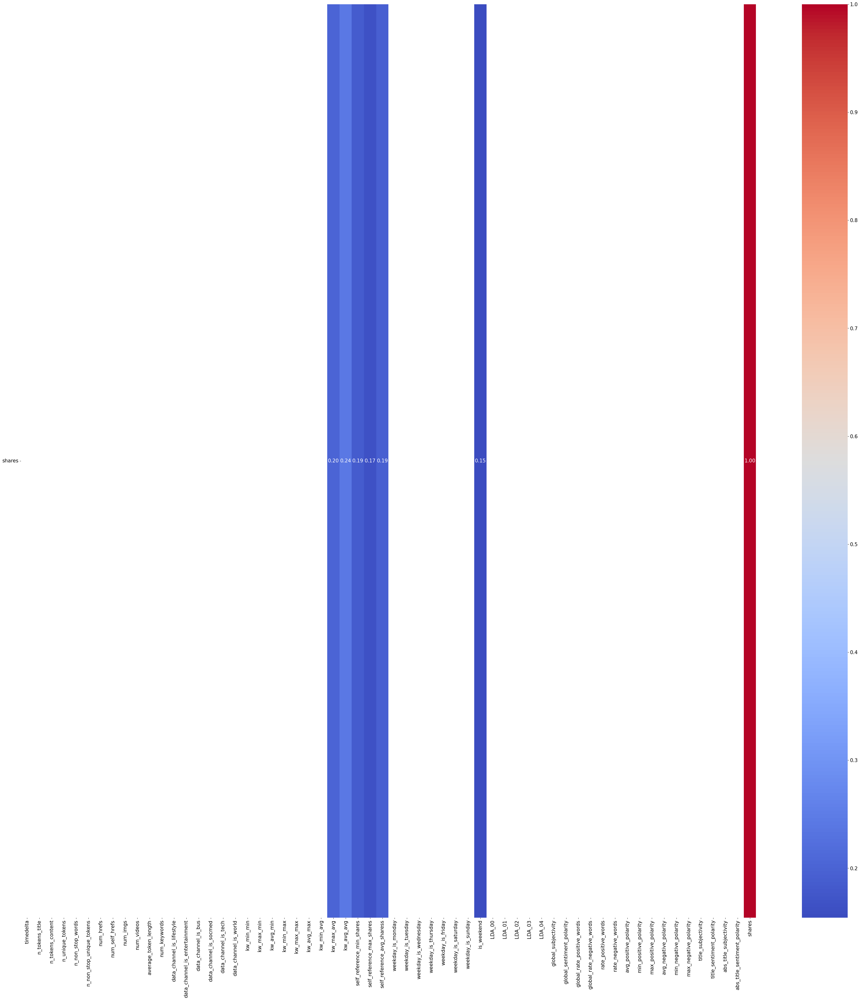

In [46]:
# calculate the correlation matrix
corr_matrix = corr_df.corr(method="spearman")

# set the threshold for displaying correlations
threshold = 0.15

# create a mask to display only correlations above a certain absolute value
mask = corr_matrix.abs() > threshold

# Set correlations below threshold to None
corr_matrix[~mask] = None

# Drop rows and columns with all None values
corr_matrix = corr_matrix.dropna(axis=1, how='all').dropna(axis=0, how='all')

# Keep only the 'shares' row
corr_matrix = corr_matrix[corr_matrix.index == 'shares']

# increase the figure size for better readability
plt.figure(figsize=(50, 50))

# plot the heatmap with the mask and correct aspect
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')

# rotate the x and y axis labels for better readability
plt.xticks(rotation=90)
plt.yticks(rotation=0)

# show the plot
plt.show()

<Axes: >

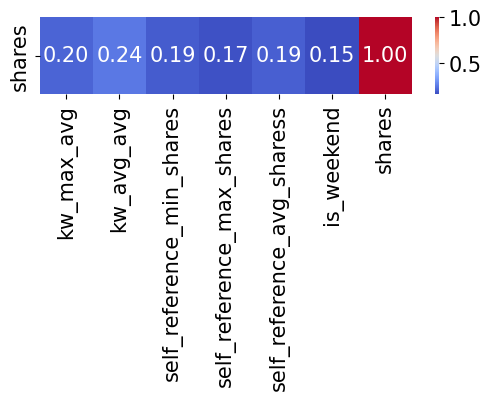

In [47]:
mask["shares"]
corr_matrix = corr_matrix.loc[:, mask["shares"]]
corr_matrix
plt.figure(figsize=(6, 1))

# plot the heatmap with the mask and correct aspect
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')

In [48]:
df["timedelta"]

0        731.0
1        731.0
2        731.0
3        731.0
4        731.0
         ...  
29994    161.0
29995    161.0
29996    161.0
29997    161.0
29998    161.0
Name: timedelta, Length: 29999, dtype: float64

In [49]:
df["url"]

0        http://mashable.com/2013/01/07/amazon-instant-...
1        http://mashable.com/2013/01/07/ap-samsung-spon...
2        http://mashable.com/2013/01/07/apple-40-billio...
3        http://mashable.com/2013/01/07/astronaut-notre...
4         http://mashable.com/2013/01/07/att-u-verse-apps/
                               ...                        
29994    http://mashable.com/2014/07/31/elance-in-the-p...
29995     http://mashable.com/2014/07/31/extant-episode-4/
29996    http://mashable.com/2014/07/31/game-of-thrones...
29997    http://mashable.com/2014/07/31/gas-explosions-...
29998    http://mashable.com/2014/07/31/gaza-palestinia...
Name: url, Length: 29999, dtype: object

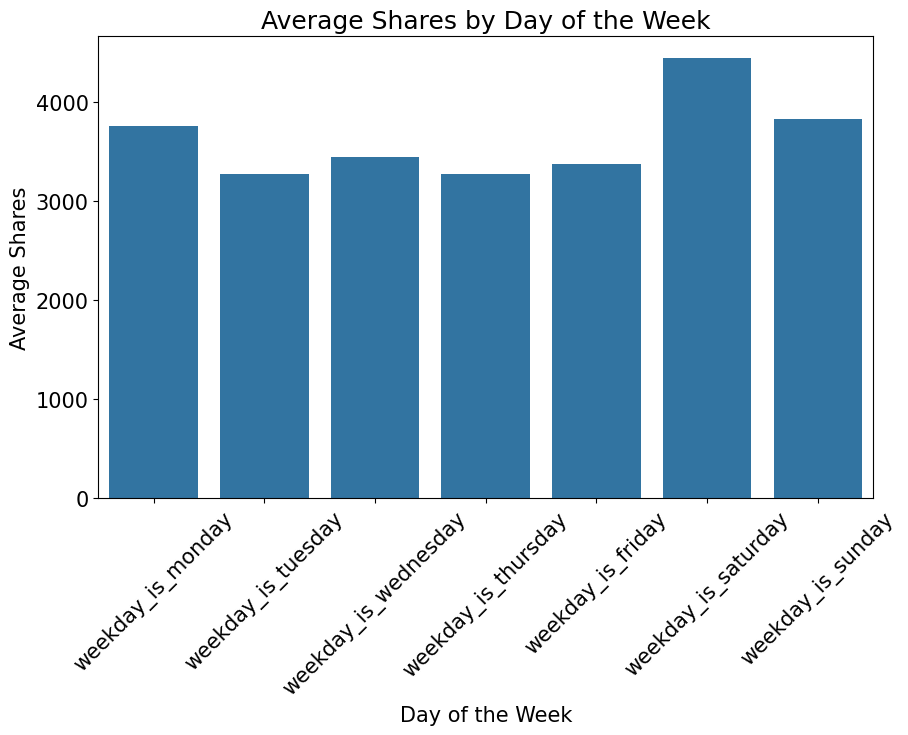

In [50]:
#Bar Charts for Categorical Variables
# Calculate average shares for each weekday
df=pd.read_csv('OnlineNewsPopularity-Train.csv')
df.columns = df.columns.str.strip()
weekday_columns = ['weekday_is_monday', 'weekday_is_tuesday', 'weekday_is_wednesday',
                   'weekday_is_thursday', 'weekday_is_friday', 'weekday_is_saturday', 'weekday_is_sunday']
averages = {day: df[df[day] == 1]['shares'].mean() for day in weekday_columns}
averages_df = pd.DataFrame(list(averages.items()), columns=['Day', 'Average Shares'])

# Bar chart for average shares by weekday
plt.figure(figsize=(10, 6))
plt.rcParams['font.size'] = FS
sns.barplot(x='Day', y='Average Shares', data=averages_df)
plt.title('Average Shares by Day of the Week')
plt.xticks(rotation=45)
plt.xlabel('Day of the Week')
plt.ylabel('Average Shares')
plt.show()

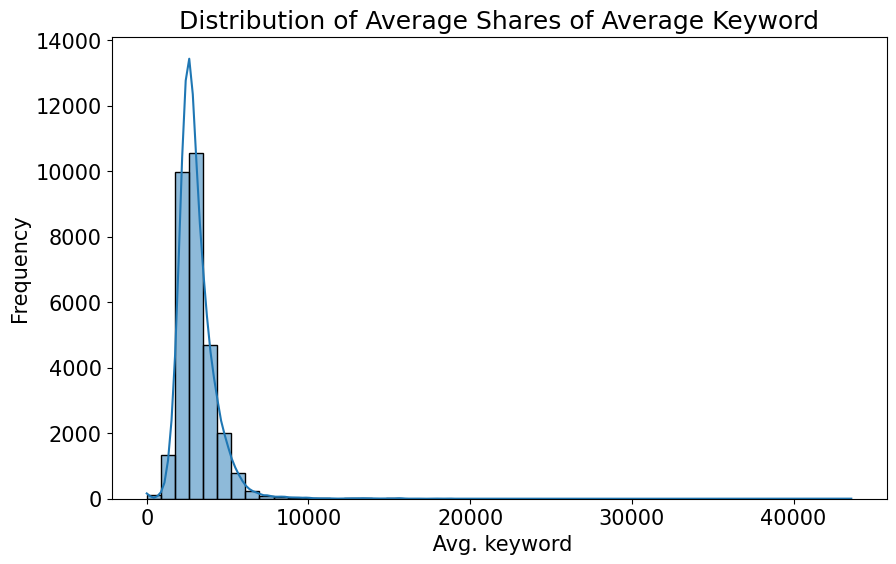

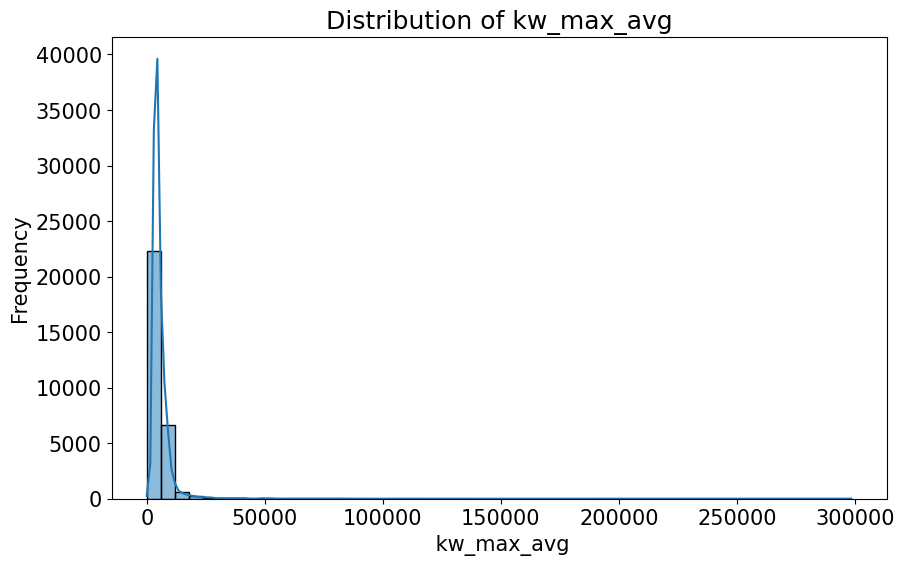

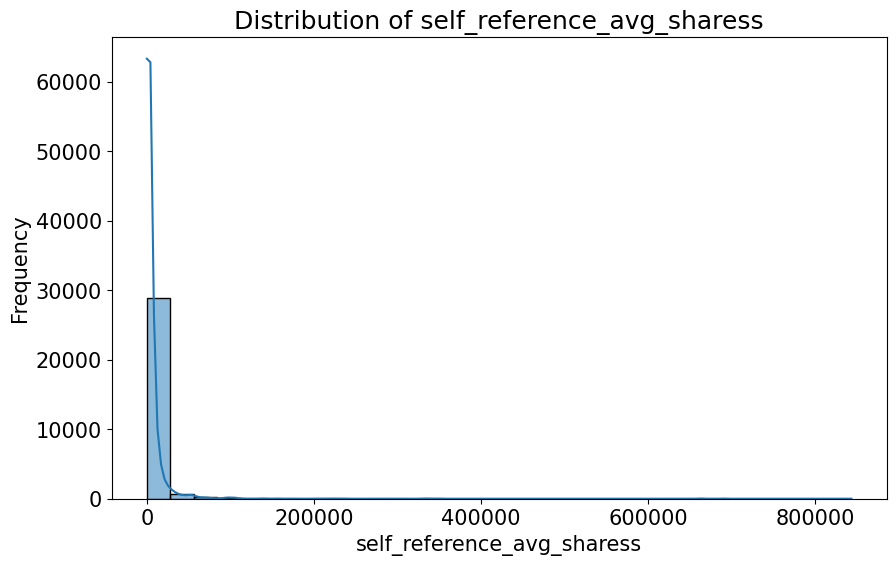

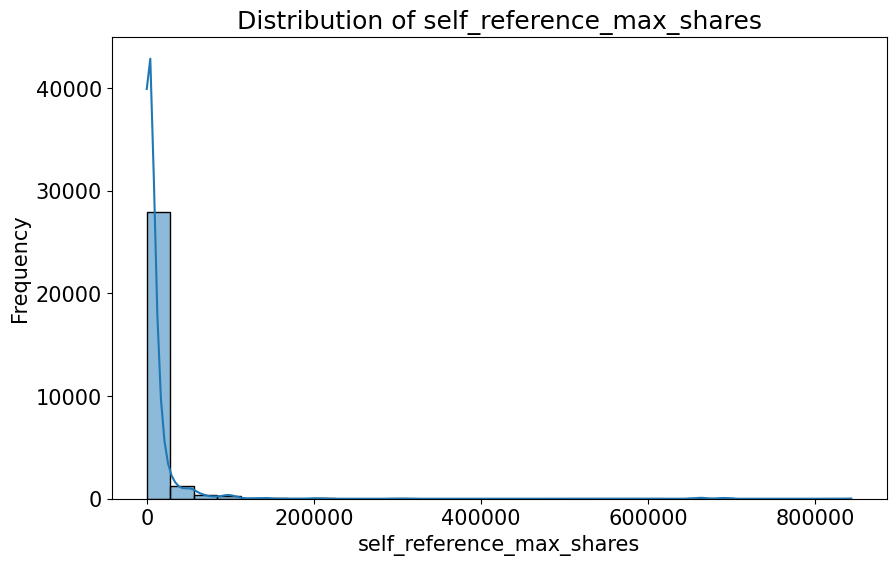

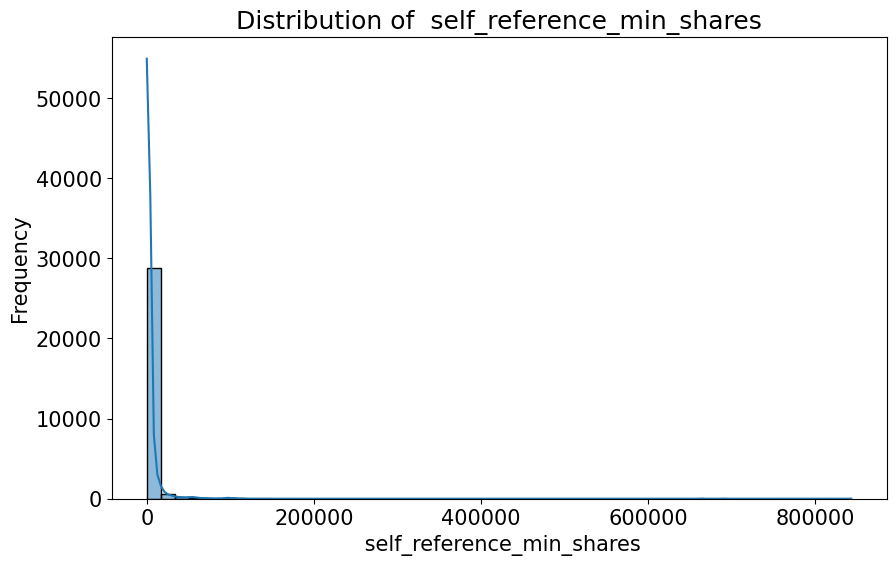

In [51]:
#we are going to visualize the four attributes that have the most correlation with the number of shares
#these attributes are kw_avg_avg,kw_max_avg,self_reference_avg_sharess,self_reference_max_shares,self_reference_min_shares
#Histograms for Numeric Variables
# Histogram for 'kw_avg_avg'
df_train = df
plt.figure(figsize=(10, 6))
sns.histplot(df_train['kw_avg_avg'], bins=50, kde=True)
plt.title('Distribution of Average Shares of Average Keyword')
plt.xlabel(' Avg. keyword')
plt.ylabel('Frequency')
plt.show()

# Histogram for 'kw_max_avg'
plt.figure(figsize=(10, 6))
sns.histplot(df_train['kw_max_avg'], bins=50, kde=True)
plt.title('Distribution of kw_max_avg')
plt.xlabel(' kw_max_avg')
plt.ylabel('Frequency')
plt.show()


# Histogram for 'self_reference_avg_sharess'
plt.figure(figsize=(10, 6))
sns.histplot(df_train['self_reference_avg_sharess'], bins=30, kde=True)
plt.title('Distribution of self_reference_avg_sharess')
plt.xlabel('self_reference_avg_sharess')
plt.ylabel('Frequency')
plt.show()


# Histogram for 'self_reference_max_shares'
plt.figure(figsize=(10, 6))
sns.histplot(df_train['self_reference_max_shares'], bins=30, kde=True)
plt.title('Distribution of self_reference_max_shares')
plt.xlabel('self_reference_max_shares')
plt.ylabel('Frequency')
plt.show()

# Histogram for 'self_reference_min_shares'
plt.figure(figsize=(10, 6))
sns.histplot(df_train['self_reference_min_shares'], bins=50, kde=True)
plt.title('Distribution of  self_reference_min_shares')
plt.xlabel(' self_reference_min_shares')
plt.ylabel('Frequency')
plt.show()

In [52]:
#finding missing data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29999 entries, 0 to 29998
Data columns (total 61 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   url                            29999 non-null  object 
 1   timedelta                      29999 non-null  float64
 2   n_tokens_title                 29999 non-null  float64
 3   n_tokens_content               29999 non-null  float64
 4   n_unique_tokens                29999 non-null  float64
 5   n_non_stop_words               29999 non-null  float64
 6   n_non_stop_unique_tokens       29999 non-null  float64
 7   num_hrefs                      29999 non-null  float64
 8   num_self_hrefs                 29999 non-null  float64
 9   num_imgs                       29999 non-null  float64
 10  num_videos                     29999 non-null  float64
 11  average_token_length           29999 non-null  float64
 12  num_keywords                   29999 non-null 

# models

## linear

In [53]:
import pandas as pd
import matplotlib.pyplot as plt
df = pd.read_csv('./content/OnlineNewsPopularity-Train.csv', header=0)

In [54]:
from sklearn.linear_model import LinearRegression
import numpy as np
x = df.drop("url", axis=1) #remove url column
x = x.drop(" shares", axis=1) # remove shares column (target)
# x = df.iloc[:, 1:-1] # this would do the same
y = df[" shares"] # extract targets

In [55]:
modelLin = LinearRegression().fit(x.values, y)

R squared Score, 1 is best: 

In [56]:
r_sq = modelLin.score(x.values, y)
r_sq

0.02267249216868561

Example Prediction:

In [57]:
y.iloc[700] # target

2200

In [58]:
y_pred = modelLin.predict(np.array(x.iloc[700]).reshape(1, -1))
y_pred[0] # prediction

1314.6593394027286

## Deep Learning

In [59]:
import torch # https://pytorch.org/get-started/locally/
import torch.nn as nn
import torch.optim as optim
import math
torch.manual_seed(0)

Normalization, not used in final version as it does not lead to better models.

In [60]:
"""
mean = torch.mean(xt, dim=0)
std = torch.std(xt, dim=0)
mean = mean.unsqueeze(0)
std = std.unsqueeze(0)

x_normalized = (xt - mean) / std
x = x_normalized
"""

'\nmean = torch.mean(xt, dim=0)\nstd = torch.std(xt, dim=0)\nmean = mean.unsqueeze(0)\nstd = std.unsqueeze(0)\n\nx_normalized = (xt - mean) / std\nx = x_normalized\n'

In [61]:
x = np.array(x) # convert the dataframe to a np array
xt = torch.tensor(x, dtype=torch.float32) # convert the np array to tensor
yt = torch.tensor(y) # convert the targes to a tensor

In [62]:
x = xt # x is the inputs as tensors

### Base Model

In [63]:
class FirstModel(torch.nn.Module):
    def __init__(self):
        super(FirstModel, self).__init__()
        self.linear1 = torch.nn.Linear(len(x[0]), 2000, bias=True) # len(x[0]) is the number of input features, 59
        self.activation = torch.nn.ReLU()
        self.linear2 = torch.nn.Linear(2000, 1, bias=True)

    def forward(self, x):
        x = self.linear1(x)
        x = self.activation(x)
        x = self.linear2(x)
        return x

In [64]:
model = FirstModel() # create the model instance

loss_fn = nn.MSELoss() # Set MSE as loss function
learning_rate = 0.00000000001 # 

# Optimize all the parameters of the model
optimizer = optim.SGD(model.parameters(), lr=learning_rate)

Epoch 0 / 600 loss: 1812073620.718182
Epoch 10 / 600 loss: 191473.4549843109
Epoch 20 / 600 loss: 181284.7235612565
Epoch 30 / 600 loss: 166483.7786972863
Epoch 40 / 600 loss: 164291.55718768318
Epoch 50 / 600 loss: 162955.20954449847
Epoch 60 / 600 loss: 162408.65425330162
Epoch 70 / 600 loss: 161679.6251163753
Epoch 80 / 600 loss: 161306.26274956035
Epoch 90 / 600 loss: 160848.79362780595
Epoch 100 / 600 loss: 160550.90031378227
Epoch 110 / 600 loss: 160266.20219992413
Epoch 120 / 600 loss: 159945.81131685115
Epoch 130 / 600 loss: 159776.08213509878
Epoch 140 / 600 loss: 159630.5942553705
Epoch 150 / 600 loss: 159414.3132995414
Epoch 160 / 600 loss: 159255.19368297645
Epoch 170 / 600 loss: 159126.13061618566
Epoch 180 / 600 loss: 159003.23857798008
Epoch 190 / 600 loss: 158864.78080066203
Epoch 200 / 600 loss: 158734.85638426262
Epoch 210 / 600 loss: 158640.438950381
Epoch 220 / 600 loss: 158603.48691424433
Epoch 230 / 600 loss: 158480.21944070896
Epoch 240 / 600 loss: 158339.9098651

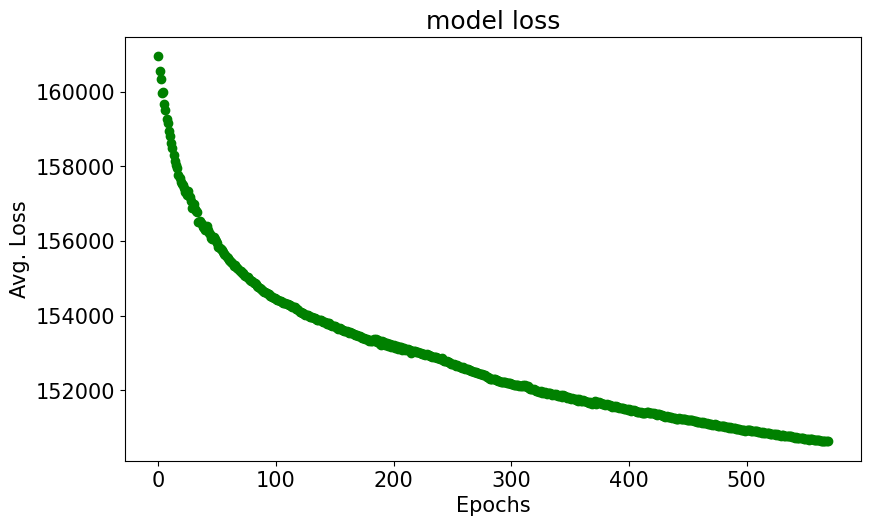

In [65]:
DEBUG = 0

DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model.to(DEVICE)

epochs = 600
batch_size = 1000
all_loss = []

for e in range(epochs):
    running_loss = 0

    for i in range(0, len(x), batch_size):
        optimizer.zero_grad()
        
        # get the current batch and send it to DEVICE
        x_batch = x[i:min(i+batch_size, len(x))].to(DEVICE)
        x_batch.to(torch.float32)
        
        y_batch = yt[i:min(i+batch_size, len(x))].to(DEVICE)
        y_batch.to(torch.float32)
        
        outputs = model(x_batch) # Make predictions for this batch

        if DEBUG>=3: print(f"out: {outputs}\ntar: {y_batch}")

        # Compute the loss and its gradients
        loss = loss_fn(outputs.squeeze(1), y_batch.to(torch.float32))
        loss.backward()

        if DEBUG>=2: print(loss)
            
        optimizer.step() # train model

        # Keep track of the loss
        running_loss += loss.item()# / batch_size
    if DEBUG >= 1: print(f"running loss: {running_loss / (i+1)}")
    if e%10 == 0: print(f"Epoch {e} / {epochs} loss: {running_loss / (i+1)}")
    all_loss +=  [running_loss / len(x)]

PLT_CUT = int(epochs/20) # make the plot more readable by cutting off the first few epochs
plt.scatter([i for i in range(epochs-PLT_CUT)], all_loss[PLT_CUT:], color="green")
plt.title(f"model loss")
plt.xlabel("Epochs")
plt.ylabel("Avg. Loss")
print(all_loss)
plt.show()

Show the predictions the model makes for the training data

In [66]:
model.to("cpu")
sum_loss = 0
i = 0
for xi in x:
    pred = model(xi).item()
    tar = y[i]
    print(f"{i} {int(pred)} {tar} Error: {abs(pred - tar)}")
    sum_loss += abs(pred - tar)**1
    i += 1 
math.sqrt(sum_loss / len(xi))

0 4458 593 Error: 3865.44775390625
1 -4541 711 Error: 5252.0126953125
2 3229 1500 Error: 1729.82373046875
3 -2845 1200 Error: 4045.041259765625
4 2539 505 Error: 2034.208251953125
5 3930 855 Error: 3075.679443359375
6 2404 556 Error: 1848.366943359375
7 2419 891 Error: 1528.818359375
8 -9210 3600 Error: 12810.634765625
9 -5136 710 Error: 5846.37841796875
10 -12830 2200 Error: 15030.1201171875
11 -6373 1900 Error: 8273.06787109375
12 -4661 823 Error: 5484.3642578125
13 5991 10000 Error: 4008.3046875
14 2355 761 Error: 1594.7197265625
15 -4097 1600 Error: 5697.2333984375
16 1410 13600 Error: 12189.056884765625
17 -2733 3100 Error: 5833.421630859375
18 2669 5700 Error: 3030.11181640625
19 3889 17100 Error: 13210.730712890625
20 2990 2800 Error: 190.190673828125
21 4033 598 Error: 3435.819580078125
22 2747 445 Error: 2302.769775390625
23 8617 1500 Error: 7117.369140625
24 2147 852 Error: 1295.273681640625
25 3281 783 Error: 2498.804443359375
26 2156 1500 Error: 656.339111328125
27 3226 180

1236.3957665840912

Test of Base Model

In [67]:
import pandas as pd
import matplotlib.pyplot as plt
df_test = pd.read_csv('OnlineNewsPopularity-Test.csv', header=0)
x_test = df_test.drop("url", axis=1)
x_test = x_test.drop(" shares", axis=1)
y_test = df_test[" shares"]

#x_test = np.array(x_test)
model.to("cpu")

FirstModel(
  (linear1): Linear(in_features=59, out_features=2000, bias=True)
  (activation): ReLU()
  (linear2): Linear(in_features=2000, out_features=1, bias=True)
)

In [68]:
print(len(y_test))
x_test_np = np.array(x_test)
running_loss_sq = 0
running_loss = 0
for i in range(len(x_test)):
    output = model(torch.tensor(x_test_np[i], dtype=torch.float32))

    # Compute the loss and its gradients
    loss = loss_fn(output, torch.tensor(y_test[i], dtype=torch.float32))

    print(int(output.item()), "-", y_test[i], " Squared Error: ", loss.item())

    # Gather data and report
    running_loss_sq += loss.item()
    running_loss += abs(output - y_test[i])

all_loss_sq =  running_loss_sq / len(y_test)
print("Mean Squared Error: ", all_loss_sq)
all_loss =  running_loss / len(y_test)
print("Mean Error", all_loss.item())

9645
2524 - 798  Squared Error:  2980337.75
3360 - 1500  Squared Error:  3460259.5
2797 - 881  Squared Error:  3672563.25
3110 - 2400  Squared Error:  505039.25
3207 - 2000  Squared Error:  1457066.5
2826 - 5900  Squared Error:  9445281.0
2878 - 835  Squared Error:  4175738.5
2537 - 1600  Squared Error:  878055.0
2744 - 762  Squared Error:  3929864.0
2791 - 473  Squared Error:  5375496.5
2874 - 1800  Squared Error:  1154994.625
2759 - 1000  Squared Error:  3095232.75
2777 - 430  Squared Error:  5512232.5
5278 - 2300  Squared Error:  8871221.0
2948 - 1500  Squared Error:  2099010.25
2803 - 944  Squared Error:  3456003.5
2805 - 47300  Squared Error:  1979723392.0
3734 - 31700  Squared Error:  782081856.0
3292 - 890  Squared Error:  5773413.0
3700 - 1300  Squared Error:  5760627.0
2634 - 686  Squared Error:  3796360.25
3861 - 737  Squared Error:  9759771.0
2847 - 933  Squared Error:  3666569.5
2730 - 874  Squared Error:  3447816.25
2740 - 4600  Squared Error:  3456150.5
2751 - 1200  Squar

C:\Users\Hasco\AppData\Local\Programs\Python\Python312\Lib\site-packages\torch\nn\modules\loss.py:535: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


2822 - 1100  Squared Error:  2965898.75
3030 - 3000  Squared Error:  941.0484619140625
2781 - 1400  Squared Error:  1908130.75
2776 - 3800  Squared Error:  1048025.5625
4122 - 3500  Squared Error:  386902.21875
2791 - 588  Squared Error:  4855522.0
2773 - 1500  Squared Error:  1622985.75
2801 - 547  Squared Error:  5083409.0
4369 - 1200  Squared Error:  10045523.0
2870 - 1100  Squared Error:  3136374.5
2943 - 1500  Squared Error:  2082256.0
2776 - 1100  Squared Error:  2809456.5
2544 - 20700  Squared Error:  329617152.0
2724 - 796  Squared Error:  3719890.0
3267 - 6000  Squared Error:  7464734.0
2858 - 1300  Squared Error:  2428307.5
2928 - 6400  Squared Error:  12054094.0
2421 - 1100  Squared Error:  1746799.125
2796 - 2800  Squared Error:  11.739322662353516
2672 - 1300  Squared Error:  1883306.625
2590 - 518  Squared Error:  4296863.5
3152 - 1100  Squared Error:  4213928.0
7509 - 968  Squared Error:  42786100.0
2759 - 764  Squared Error:  3983050.25
2718 - 426  Squared Error:  52554

### More Models

In [69]:
comparative_loss = {} # used to store the loss of each model

train_model_name() takes a model and its name and trains it and plots the training loss and adds it to comparative_loss.

In [70]:
def train_model_name(model, name, learning_rate = 0.0000000001):
   
    loss_fn = nn.MSELoss() # Set MSE as loss function
     
    # Optimize all the parameters of the model
    optimizer = optim.SGD(model.parameters(), lr=learning_rate)
    
    DEBUG = 0
    DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model.to(DEVICE)
    
    epochs = 600
    batch_size = 1000
    all_loss = []
        
    for e in range(epochs):
        running_loss = 0
        
        for i in range(0, len(x), batch_size):
            optimizer.zero_grad()
            
            # get the current batch and send it to DEVICE
            x_batch = x[i:min(i+batch_size, len(x))].to(DEVICE)
            x_batch.to(torch.float32)
            
            y_batch = yt[i:min(i+batch_size, len(x))].to(DEVICE)
            y_batch.to(torch.float32)
            
            outputs = model(x_batch) # Make predictions for this batch
    
            if DEBUG>=3: print(f"out: {outputs}\ntar: {y_batch}")
    
            # Compute the loss and its gradients
            loss = loss_fn(outputs.squeeze(1), y_batch.to(torch.float32))
            loss.backward()
    
            if DEBUG>=2: print(loss)
            optimizer.step()
    
            # Gather data and report
            running_loss += loss.item()# / batch_size
        if DEBUG >= 1: print(f"running loss: {running_loss / (i+1)}")
        if e%10 == 0: print(f"Epoch {e} / {epochs} loss: {running_loss / (i+1)}")
        all_loss +=  [running_loss / len(x)]

    comparative_loss[name] = all_loss[-1]
    
    PLT_CUT = 0
    plt.scatter([i for i in range(epochs-PLT_CUT)], all_loss[PLT_CUT:], color="green")
    plt.title(f"model loss")
    plt.xlabel("Epochs")
    plt.ylabel("Avg. Loss")
    plt.show()
    plt.close()
    
    PLT_CUT = int(epochs/20)
    plt.scatter([i for i in range(epochs-PLT_CUT)], all_loss[PLT_CUT:], color="green")
    plt.title(f"model loss")
    plt.xlabel("Epochs")
    plt.ylabel("Avg. Loss")
    print(all_loss)
    plt.show()

The following models are built and compared:

In [71]:
class FirstModelSmall(torch.nn.Module):
    def __init__(self):
        super(FirstModelSmall, self).__init__()
        self.linear1 = torch.nn.Linear(len(x[0]), 200, bias=True)
        self.activation = torch.nn.ReLU()
        self.linear2 = torch.nn.Linear(200, 1, bias=True)

    def forward(self, x):
        x = self.linear1(x)
        x = self.activation(x)
        x = self.linear2(x)
        return x

In [72]:
class FirstModelVerySmall(torch.nn.Module):
    def __init__(self):
        super(FirstModelVerySmall, self).__init__()
        self.linear1 = torch.nn.Linear(len(x[0]), 20, bias=True)
        self.activation = torch.nn.ReLU()
        self.linear2 = torch.nn.Linear(20, 1, bias=True)

    def forward(self, x):
        x = self.linear1(x)
        x = self.activation(x)
        x = self.linear2(x)
        return x

In [73]:
class FirstModelTiny(torch.nn.Module):
    def __init__(self):
        super(FirstModelTiny, self).__init__()
        self.linear1 = torch.nn.Linear(len(x[0]), 10, bias=True)
        self.activation = torch.nn.ReLU()
        self.linear2 = torch.nn.Linear(10, 1, bias=True)

    def forward(self, x):
        x = self.linear1(x)
        x = self.activation(x)
        x = self.linear2(x)
        return x

In [74]:
class FirstModelVeryTiny(torch.nn.Module):
    def __init__(self):
        super(FirstModelVeryTiny, self).__init__()
        self.linear1 = torch.nn.Linear(len(x[0]), 5, bias=True)
        self.activation = torch.nn.ReLU()
        self.linear2 = torch.nn.Linear(5, 1, bias=True)

    def forward(self, x):
        x = self.linear1(x)
        x = self.activation(x)
        x = self.linear2(x)
        return x

In [75]:
class FirstModel3Layer(torch.nn.Module):
    def __init__(self):
        super(FirstModel3Layer, self).__init__()
        self.linear1 = torch.nn.Linear(len(x[0]), 200, bias=True)
        self.activation = torch.nn.ReLU()
        self.linear2 = torch.nn.Linear(200, 200, bias=True)
        self.linear3 = torch.nn.Linear(200, 1, bias=True)

    def forward(self, x):
        x = self.linear1(x)
        x = self.activation(x)
        x = self.linear2(x)
        x = self.activation(x)
        x = self.linear3(x)
        return x

In [76]:
modelSmall = FirstModelSmall()
modelVerySmall = FirstModelVerySmall()
modelTiny = FirstModelTiny()
modelVeryTiny = FirstModelVeryTiny()
model3Layer = FirstModel3Layer()
modelLin # The linear model from earlier
model # the base model from earlier

FirstModel(
  (linear1): Linear(in_features=59, out_features=2000, bias=True)
  (activation): ReLU()
  (linear2): Linear(in_features=2000, out_features=1, bias=True)
)

Training the models:

Epoch 0 / 600 loss: 36049895.71697528
Epoch 10 / 600 loss: 166522.4323988828
Epoch 20 / 600 loss: 167362.56301506844
Epoch 30 / 600 loss: 168336.56832523015
Epoch 40 / 600 loss: 166199.76807696285
Epoch 50 / 600 loss: 168659.48712113374
Epoch 60 / 600 loss: 169873.89014171925
Epoch 70 / 600 loss: 167981.77483535052
Epoch 80 / 600 loss: 167667.26547360435
Epoch 90 / 600 loss: 168730.60908244544
Epoch 100 / 600 loss: 167009.11768559704
Epoch 110 / 600 loss: 168184.37571118237
Epoch 120 / 600 loss: 166429.92407158375
Epoch 130 / 600 loss: 166717.86062549567
Epoch 140 / 600 loss: 165799.9697251819
Epoch 150 / 600 loss: 166449.80745491534
Epoch 160 / 600 loss: 165907.42450260336
Epoch 170 / 600 loss: 165120.51336160823
Epoch 180 / 600 loss: 165541.9922761284
Epoch 190 / 600 loss: 164998.6208061791
Epoch 200 / 600 loss: 164531.95938071102
Epoch 210 / 600 loss: 164790.15985655668
Epoch 220 / 600 loss: 164816.6965966691
Epoch 230 / 600 loss: 164411.96820799282
Epoch 240 / 600 loss: 164703.3638

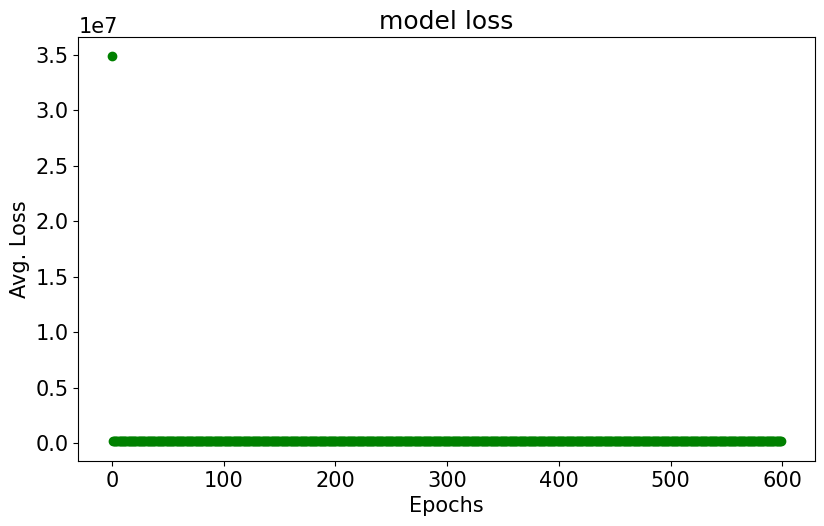

[34850595.8761292, 171738.18780626022, 171493.89939664656, 170988.4718157272, 161087.03070102338, 160963.90039667988, 160961.0409013634, 161236.08680289343, 160939.2509083636, 160972.2488749625, 160982.60148671622, 161491.60432014402, 161365.0395013167, 161260.28854295143, 161269.30244341478, 161699.04250141673, 161522.38161272043, 161366.83762792093, 161377.1175039168, 163545.75439181307, 161794.7828260942, 161766.9464982166, 161995.1204373479, 161431.7553251775, 164983.15810527018, 164342.5296843228, 161459.2775092503, 160438.18227274242, 160235.5567852262, 160078.82109403648, 162736.38514617155, 161433.27164238808, 160601.4491816394, 160233.65198839962, 160163.94739824662, 160613.81846061535, 161822.98603286778, 162909.15097169907, 162383.70665688856, 162027.76819227307, 160670.67148904962, 164745.81226040868, 164428.51688389614, 160410.16707223575, 160774.6204206807, 160501.22977432582, 164665.94813160438, 161504.89662988766, 162436.62902096738, 160333.9673989133, 163048.5611520384

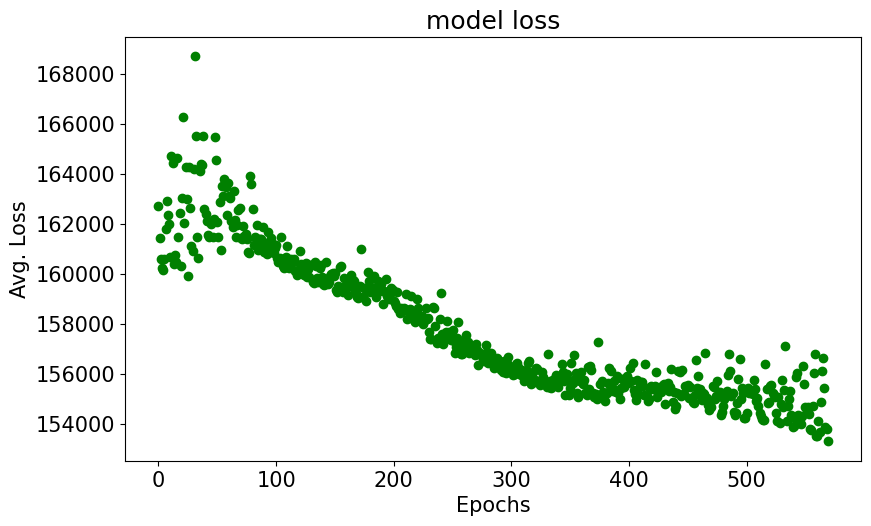

Epoch 0 / 600 loss: 572460.9544498465
Epoch 10 / 600 loss: 166898.79024861212
Epoch 20 / 600 loss: 165934.2148201786
Epoch 30 / 600 loss: 166325.0065859798
Epoch 40 / 600 loss: 165900.80507568704
Epoch 50 / 600 loss: 167612.34647081135
Epoch 60 / 600 loss: 170557.96841488226
Epoch 70 / 600 loss: 170094.68245922556
Epoch 80 / 600 loss: 166822.70811351333
Epoch 90 / 600 loss: 172668.1532360953
Epoch 100 / 600 loss: 170474.7240439985
Epoch 110 / 600 loss: 167477.74028481776
Epoch 120 / 600 loss: 167414.07261818557
Epoch 130 / 600 loss: 170145.65642564048
Epoch 140 / 600 loss: 173275.66587359057
Epoch 150 / 600 loss: 168240.97962139235
Epoch 160 / 600 loss: 171453.25278438674
Epoch 170 / 600 loss: 173137.89421054447
Epoch 180 / 600 loss: 175539.09003137823
Epoch 190 / 600 loss: 174220.86755629117
Epoch 200 / 600 loss: 170736.90900313781
Epoch 210 / 600 loss: 174080.22564739146
Epoch 220 / 600 loss: 169593.58746250128
Epoch 230 / 600 loss: 168838.4112961622
Epoch 240 / 600 loss: 170235.7281

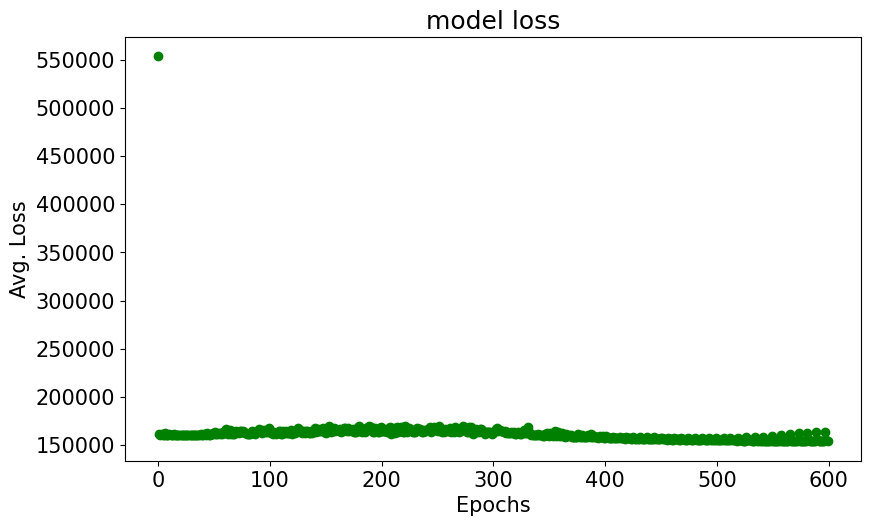

[553416.4518817294, 161144.91183039435, 161011.3596453215, 161268.811760392, 160968.86349544986, 160820.58308610288, 162399.0716357212, 160830.15000500018, 160763.25537517917, 160672.98223274108, 161346.43874795825, 160656.896429881, 160599.1808393613, 160458.70909030302, 161043.8333277776, 160626.57481916063, 160558.67208906965, 160546.04253475115, 160917.74772492418, 160636.4009466982, 160413.95259841994, 160551.94586486215, 160963.98206606886, 160601.6430547685, 160381.11517050568, 160531.7257908597, 160753.94346478215, 160583.02130071, 160385.0571019034, 160545.54625154173, 160791.74359145304, 160552.84002800094, 160417.06716890563, 160592.02800093335, 160762.6360212007, 160572.1600053335, 160534.59268642287, 160659.52751758392, 161161.72765758858, 160733.0817693923, 160381.65432181073, 161396.33181106037, 161307.0757691923, 160512.99729991, 162233.74705823528, 160423.77752591754, 160540.8191606387, 161170.07360245343, 161076.85062835427, 162286.0440014667, 162036.25654188474, 1634

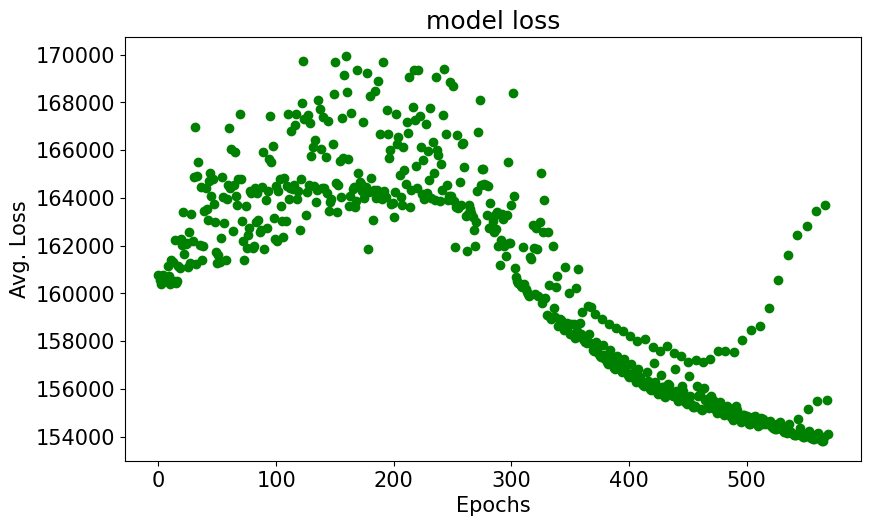

Epoch 0 / 600 loss: 173922.40722733698
Epoch 10 / 600 loss: 166408.41136512533
Epoch 20 / 600 loss: 166556.6285300507
Epoch 30 / 600 loss: 165978.66997689733
Epoch 40 / 600 loss: 166002.20454467088
Epoch 50 / 600 loss: 166127.0318954519
Epoch 60 / 600 loss: 167333.0377573187
Epoch 70 / 600 loss: 168308.67687321125
Epoch 80 / 600 loss: 168826.42046825972
Epoch 90 / 600 loss: 169858.1039964139
Epoch 100 / 600 loss: 169856.25619806212
Epoch 110 / 600 loss: 171834.544463984
Epoch 120 / 600 loss: 173262.15330505845
Epoch 130 / 600 loss: 174418.765421882
Epoch 140 / 600 loss: 170330.0482052343
Epoch 150 / 600 loss: 170315.63718492465
Epoch 160 / 600 loss: 170266.46825971518
Epoch 170 / 600 loss: 168965.8323506086
Epoch 180 / 600 loss: 170273.19788972795
Epoch 190 / 600 loss: 175218.3500568946
Epoch 200 / 600 loss: 176625.86255646357
Epoch 210 / 600 loss: 170357.644288128
Epoch 220 / 600 loss: 170661.0787214234
Epoch 230 / 600 loss: 171414.44977759387
Epoch 240 / 600 loss: 175454.0466190821
E

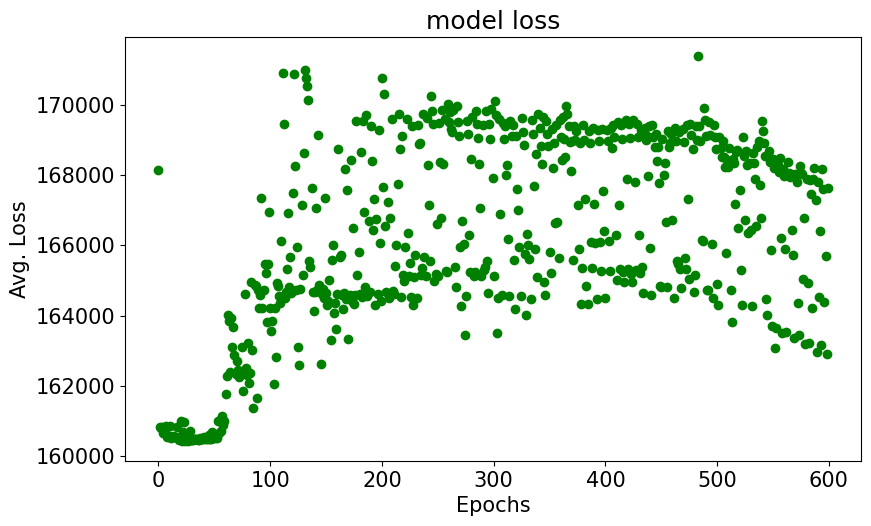

[168136.3956131871, 160836.9525650855, 160802.43514783826, 160836.0676022534, 160671.4303143438, 160662.66302210075, 160700.54275142503, 160865.58705290177, 160540.95509850327, 160589.42411413713, 160872.37367912263, 160511.8519950665, 160540.39294643156, 160590.36707890264, 160558.0416680556, 160537.69352311743, 160548.39854661823, 160841.46511550384, 160474.79295976533, 160486.4620820694, 161015.6599886663, 160433.36824560817, 160677.37564585486, 160982.95209840327, 160420.6625554185, 160516.29834327812, 160438.096069869, 160451.41291376378, 160717.57518583952, 160476.6650888363, 160456.92883096103, 160463.3053768459, 160480.81162705424, 160483.31431047703, 160486.4844828161, 160458.7900263342, 160459.92653088438, 160512.6564885496, 160494.98776625888, 160490.80729357645, 160479.6804560152, 160561.40778025935, 160496.37174572487, 160486.28880962697, 160486.85182839428, 160591.87106236874, 160504.27474249143, 160482.20840694688, 160675.99173305777, 160505.8796626554, 160600.3550785026

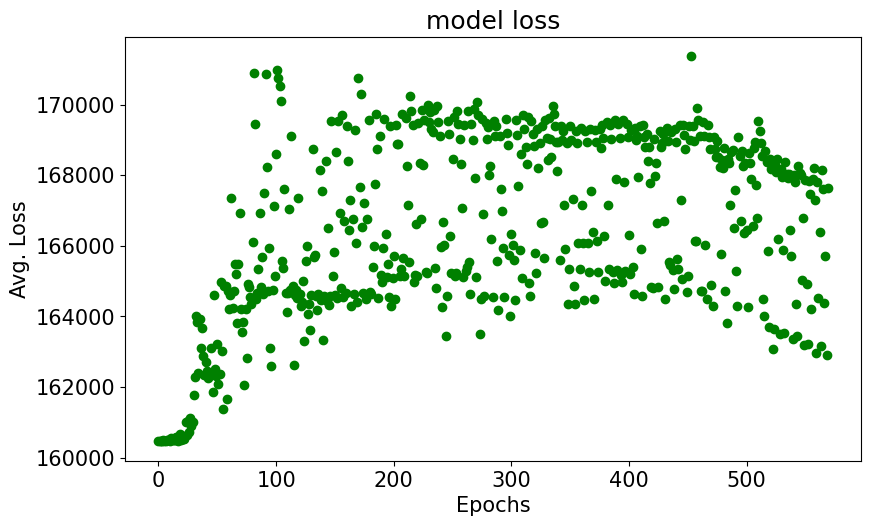

Epoch 0 / 600 loss: 1561482.3970897556
Epoch 10 / 600 loss: 177332.95403606773
Epoch 20 / 600 loss: 177327.96338057308
Epoch 30 / 600 loss: 177325.26878383505
Epoch 40 / 600 loss: 177320.85597048377
Epoch 50 / 600 loss: 166296.8574187097
Epoch 60 / 600 loss: 166552.77190441708
Epoch 70 / 600 loss: 166932.71832005793
Epoch 80 / 600 loss: 168507.73021619944
Epoch 90 / 600 loss: 170310.85134995345
Epoch 100 / 600 loss: 171056.86734940176
Epoch 110 / 600 loss: 175072.36647012172
Epoch 120 / 600 loss: 172542.76969759664
Epoch 130 / 600 loss: 171466.7342505431
Epoch 140 / 600 loss: 172046.7434226406
Epoch 150 / 600 loss: 176250.41019275197
Epoch 160 / 600 loss: 176183.7135960829
Epoch 170 / 600 loss: 176100.31757525602
Epoch 180 / 600 loss: 173927.75711182374
Epoch 190 / 600 loss: 171633.0410675494
Epoch 200 / 600 loss: 176358.4211578911
Epoch 210 / 600 loss: 171527.93938140065
Epoch 220 / 600 loss: 175270.32171304437
Epoch 230 / 600 loss: 172504.27095617392
Epoch 240 / 600 loss: 176407.4625

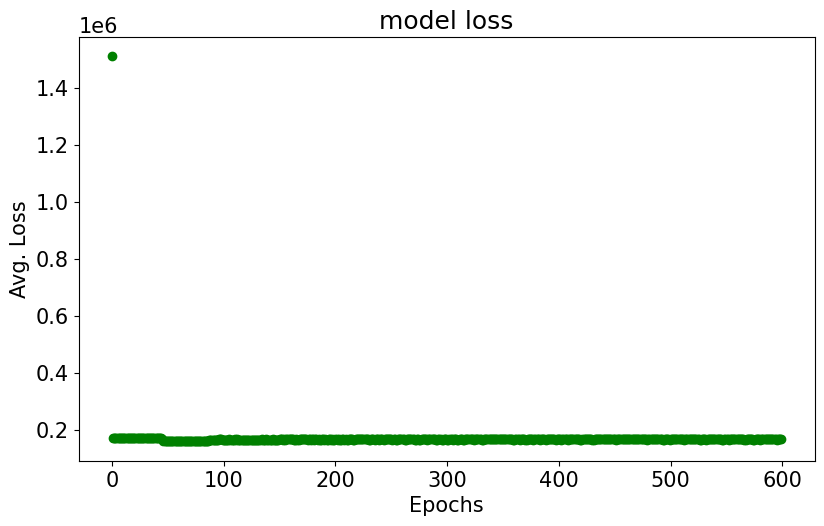

[1509535.3511117038, 171448.64082136072, 171445.81426047534, 171443.4563818794, 171441.46571552384, 171439.72159071968, 171438.17433914464, 171436.8040268009, 171435.5795859862, 171434.4790159672, 171433.4811160372, 171432.56741891397, 171431.80572685756, 171431.24417480582, 171430.8173605787, 171430.405280176, 171430.01346711558, 171429.6460548685, 171429.299309977, 171428.9719657322, 171428.6564885496, 171428.3539451315, 171428.05773525784, 171427.78345944863, 171427.52211740392, 171427.27177572585, 171427.02243408113, 171426.78195939865, 171426.54348478283, 171426.30534351146, 171426.05153505117, 171425.77932597752, 171425.4249808327, 171425.07690256342, 171424.70769025633, 171424.29247641587, 171423.87659588654, 171423.4267142238, 171422.89022967432, 171422.33014433814, 171421.78552618422, 171421.24017467248, 171419.0793693123, 171393.38484616153, 171351.02210073668, 167739.6327877596, 160722.90983032767, 160679.28157605254, 160702.0429347645, 160729.8289942998, 160764.53088436282,

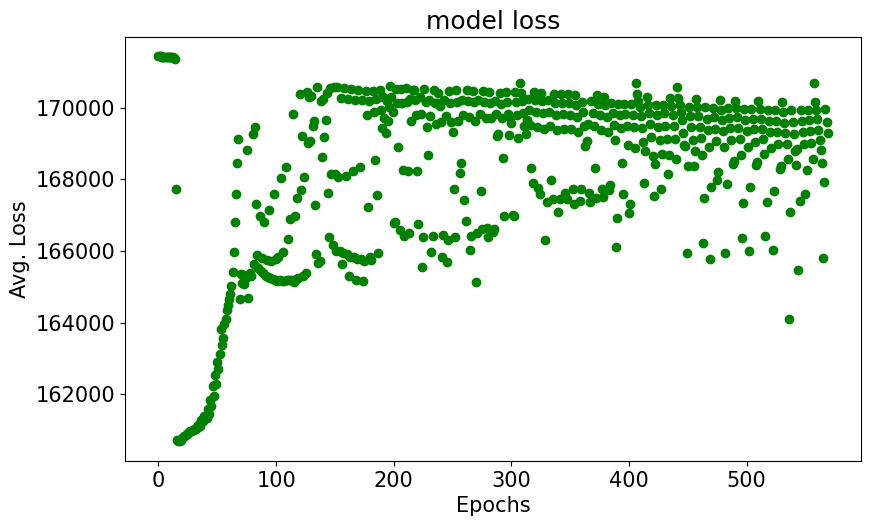

Epoch 0 / 600 loss: 424959.7909727251
Epoch 10 / 600 loss: 164245.77683528155
Epoch 20 / 600 loss: 163854.05061894417
Epoch 30 / 600 loss: 163602.47894900176
Epoch 40 / 600 loss: 163383.94241577876
Epoch 50 / 600 loss: 163208.42984724665
Epoch 60 / 600 loss: 163076.18440743422
Epoch 70 / 600 loss: 162957.2196820799
Epoch 80 / 600 loss: 162863.2099582773
Epoch 90 / 600 loss: 162782.08006620462
Epoch 100 / 600 loss: 162707.115685666
Epoch 110 / 600 loss: 162646.64142615773
Epoch 120 / 600 loss: 162585.7209751388
Epoch 130 / 600 loss: 162530.77521464776
Epoch 140 / 600 loss: 162472.98141443398
Epoch 150 / 600 loss: 162432.0992379573
Epoch 160 / 600 loss: 162388.92210613427
Epoch 170 / 600 loss: 162341.86959070378
Epoch 180 / 600 loss: 162314.75369814833
Epoch 190 / 600 loss: 162261.37436640117
Epoch 200 / 600 loss: 162225.1499603462
Epoch 210 / 600 loss: 162193.98772456122
Epoch 220 / 600 loss: 162154.50605151546
Epoch 230 / 600 loss: 162119.37588359023
Epoch 240 / 600 loss: 162089.814006

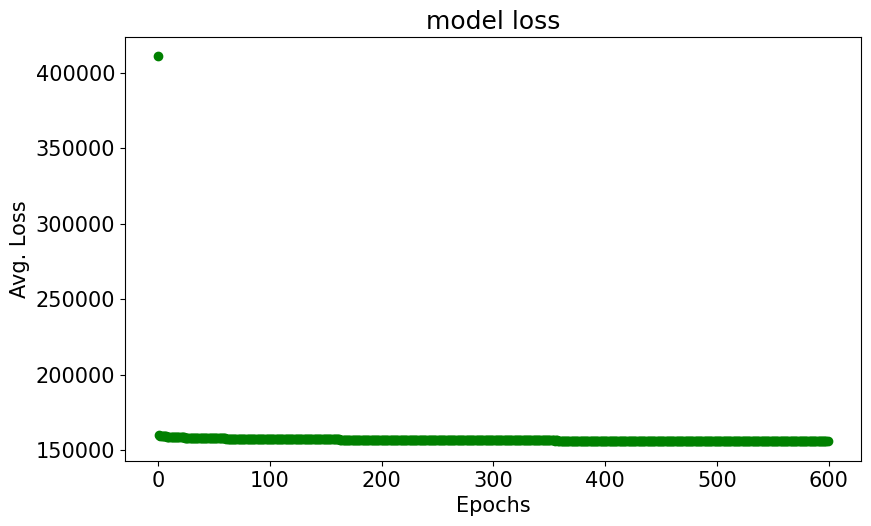

[410822.32401080034, 159856.63135437848, 159569.25077502584, 159383.16490549684, 159244.30661022034, 159133.94719823994, 159043.3620454015, 158968.3127437581, 158901.85372845762, 158839.5307843595, 158781.68518950633, 158729.05510183674, 158682.55695189838, 158638.79575985865, 158598.71689056302, 158552.1835394513, 158515.79379312645, 158486.43568118938, 158458.2422080736, 158432.00360012, 158402.99083302775, 158372.76995899863, 158344.6903563452, 158317.71705723525, 158293.06136871228, 158270.87036234542, 158247.780259342, 158226.95963198773, 158205.69892329743, 158183.69358978633, 158159.78839294644, 158133.4351145038, 158104.30901030035, 158082.2512750425, 158062.31461048702, 158039.87112903764, 158021.71412380412, 158001.97753258442, 157984.9266975566, 157967.48318277276, 157948.52208406947, 157931.9238641288, 157912.29334311144, 157894.59468648955, 157875.87032901097, 157859.4154471816, 157844.8370945698, 157826.78422614088, 157811.98346611555, 157796.81116037202, 157778.848428280

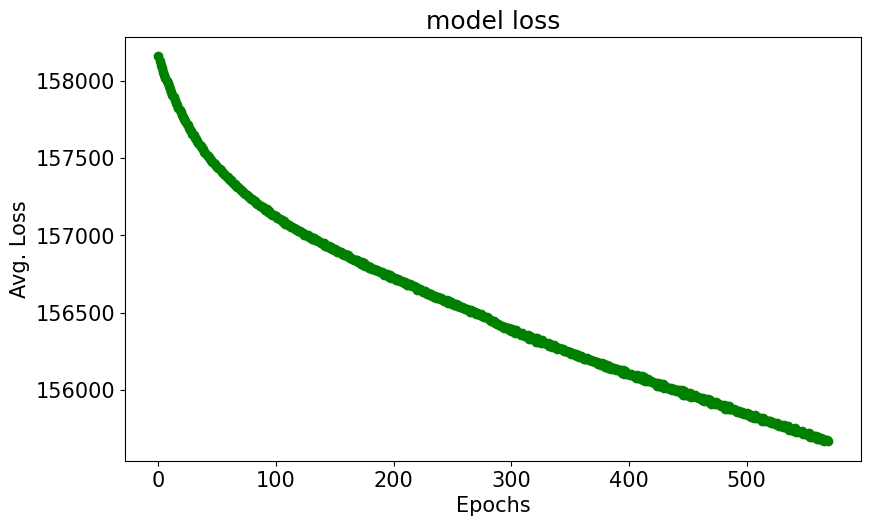

In [77]:
train_model_name(modelSmall, "small")
train_model_name(modelVerySmall, "very small")
train_model_name(modelTiny, "tiny")
train_model_name(modelVeryTiny, "very tiny")
train_model_name(model3Layer, "3 Layers Small",  learning_rate = 0.00000000001)

In [78]:
# Learning Rates when using normalized input data: 
"""
train_model_name(modelSmall, "small", learning_rate = 0.0000001)
train_model_name(modelVerySmall, "very small", learning_rate = 0.0000001)
train_model_name(modelTiny, "tiny", learning_rate = 0.0000001)
train_model_name(modelVeryTiny, "very tiny", learning_rate = 0.0000001)
train_model_name(model3Layer, "3 Layers Small",  learning_rate = 0.0000001)
"""

'\ntrain_model_name(modelSmall, "small", learning_rate = 0.0000001)\ntrain_model_name(modelVerySmall, "very small", learning_rate = 0.0000001)\ntrain_model_name(modelTiny, "tiny", learning_rate = 0.0000001)\ntrain_model_name(modelVeryTiny, "very tiny", learning_rate = 0.0000001)\ntrain_model_name(model3Layer, "3 Layers Small",  learning_rate = 0.0000001)\n'

In [79]:
comparative_loss

{'small': 153312.579419314,
 'very small': 154099.08716957233,
 'tiny': 167634.13167105571,
 'very tiny': 169287.21177372578,
 '3 Layers Small': 155664.11280376013}

Compare the training loss:

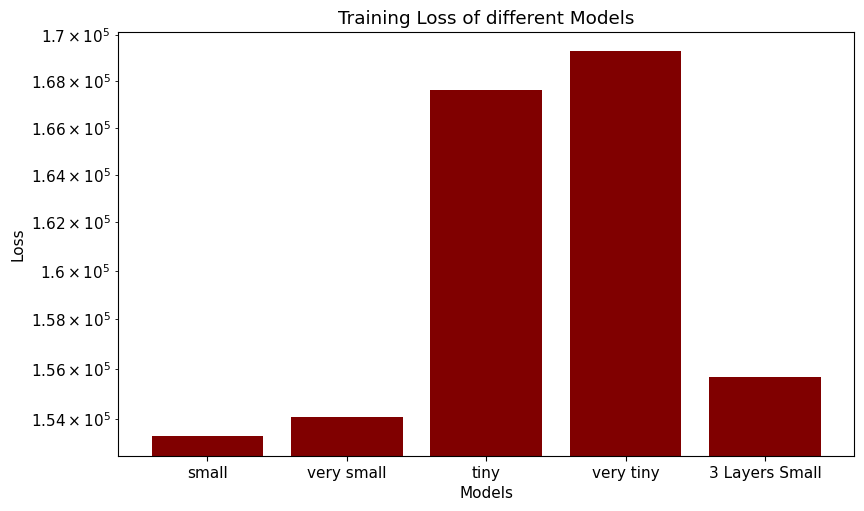

In [80]:
plt.rcParams['font.size'] = 11
plt.bar(comparative_loss.keys(), comparative_loss.values(), color ='maroon')
plt.xlabel('Models')
plt.ylabel('Loss')
plt.title('Training Loss of different Models')
plt.yscale('log')
plt.show()

### Test all models

In [81]:
comparative_loss_test = {}

In [82]:
def test_model_name(model, name):
    model.to("cpu")
    running_loss_sq = 0
    running_loss = 0
    for i in range(len(x_test)):
        output = model(torch.tensor(x_test_np[i], dtype=torch.float32))
    
        # Compute the loss and its gradients
        loss = loss_fn(output, torch.tensor(y_test[i], dtype=torch.float32))
    
        print(name, output.item(), "-", y_test[i], "=", loss.item())
    
        running_loss_sq += loss.item()
        running_loss += abs(output - y_test[i])
    
    all_loss_sq =  running_loss_sq / len(y_test)
    print("Mean Squared Error: ", all_loss_sq)
    all_loss =  running_loss / len(y_test)
    print("Mean Error", all_loss.item())
    comparative_loss_test[name] = all_loss_sq

Calculate the Error of the linear model over the Test data:

In [83]:
modelLin
x = df_test.iloc[:, 1:-1]
running_loss_sq = 0
running_loss = 0
for i in range(len(x_test)):
    output = modelLin.predict(np.array(x.iloc[i]).reshape(1, -1))

    print(output.item(), "-", y_test[i])

    running_loss_sq += abs(output - y_test[i])**2
    running_loss += abs(output - y_test[i])

all_loss_sq =  running_loss_sq[0] / len(y_test)
print("Squared Error: ", all_loss_sq)
all_loss =  running_loss / len(y_test)
print("Error", all_loss.item())
comparative_loss_test["LINEAR"] = all_loss_sq

2402.0221898376867 - 798
2050.6475360902223 - 1500
1449.5842174228742 - 881
1891.568413974268 - 2400
5243.774326347623 - 2000
687.2420671713207 - 5900
2571.9019155650476 - 835
2290.723495449937 - 1600
1933.135949486391 - 762
2363.4106352225017 - 473
3583.0302770474946 - 1800
1758.2530063350177 - 1000
2606.9819091547497 - 430
1645.2239800928446 - 2300
2302.477178830145 - 1500
868.697952589026 - 944
1941.2625062053166 - 47300
2089.8344831115883 - 31700
3517.528277605391 - 890
5719.567107769256 - 1300
1794.592504209526 - 686
1173.0485155160486 - 737
3473.513249324722 - 933
1666.379505878238 - 874
1349.8400787495361 - 4600
4624.213843327342 - 1200
5834.339330372105 - 399
2785.084633151604 - 1400
2595.714206643662 - 1000
1179.636185046153 - 1300
5299.44366445915 - 1600
1823.998590124871 - 417
3288.1986737326633 - 5400
5553.30600916296 - 409
5599.652328410978 - 1100
1523.6029652588036 - 993
3850.4236402744473 - 660
2942.603743493003 - 916
2972.430143030634 - 3400
3977.919784268278 - 6100
328

Calculate the Error of the new models over the Test data:

In [84]:
test_model_name(modelSmall, "small")
test_model_name(modelVerySmall, "very small")
test_model_name(modelTiny, "tiny")
test_model_name(modelVeryTiny, "very tiny")
test_model_name(model3Layer, "3 layer")
test_model_name(model, "big")

small 2953.91650390625 - 798 = 4647976.0
small 3560.71923828125 - 1500 = 4246564.0
small 1946.2125244140625 - 881 = 1134677.75
small 3234.618896484375 - 2400 = 696588.6875
small 3183.520751953125 - 2000 = 1400721.375
small 1960.1964111328125 - 5900 = 15522053.0
small 2637.459716796875 - 835 = 3248861.0
small 2729.2568359375 - 1600 = 1275221.0
small 2533.2392578125 - 762 = 3137288.5
small 2581.4951171875 - 473 = 4445751.5
small 3059.4560546875 - 1800 = 1586229.5
small 2571.9423828125 - 1000 = 2471002.75
small 2378.697265625 - 430 = 3797421.0
small 3807.600341796875 - 2300 = 2272858.75
small 3152.82177734375 - 1500 = 2731819.75
small 1893.78515625 - 944 = 902091.8125
small 1990.625732421875 - 47300 = 2052939520.0
small 3278.807373046875 - 31700 = 807764224.0
small 3322.195068359375 - 890 = 5915573.0
small 3452.2998046875 - 1300 = 4632394.5
small 2998.951171875 - 686 = 5349743.0
small 3528.654052734375 - 737 = 7793332.5
small 2584.888671875 - 933 = 2728736.25
small 2538.233642578125 - 874

C:\Users\Hasco\AppData\Local\Programs\Python\Python312\Lib\site-packages\torch\nn\modules\loss.py:535: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


small 1735.375732421875 - 1600 = 18326.58984375
small 3110.225341796875 - 903 = 4871843.5
small 2575.6865234375 - 789 = 3192248.75
small 2081.767333984375 - 675 = 1978994.375
small 2220.635986328125 - 875 = 1810736.25
small 2799.017822265625 - 1100 = 2886661.5
small 3083.2333984375 - 915 = 4701236.0
small 3428.68798828125 - 963 = 6079617.5
small 3311.319091796875 - 700 = 6818987.5
small 3240.510009765625 - 933 = 5324602.5
small 3558.2392578125 - 453 = 9642511.0
small 2845.89208984375 - 881 = 3860801.0
small 2105.9423828125 - 855 = 1564856.875
small 2233.012451171875 - 1100 = 1283717.25
small 2281.489501953125 - 511 = 3134633.0
small 2957.492431640625 - 1200 = 3088779.75
small 2573.0771484375 - 949 = 2637626.5
small 4177.40673828125 - 2000 = 4741100.0
small 2473.26171875 - 712 = 3102042.75
small 2887.66357421875 - 1100 = 3195741.0
small 2347.048828125 - 678 = 2785724.0
small 2906.517578125 - 2700 = 42649.51171875
small 3172.322998046875 - 4200 = 1056120.0
small 2764.2587890625 - 3600 = 

In [85]:
comparative_loss_test

{'LINEAR': 64202950.86083535,
 'small': 60196775.81801162,
 'very small': 60424287.82203186,
 'tiny': 70552859.76639265,
 'very tiny': 69968039.46893772,
 '3 layer': 60567361.856652714,
 'big': 60730932.0755229}

Plot of the model comparison (Test data):

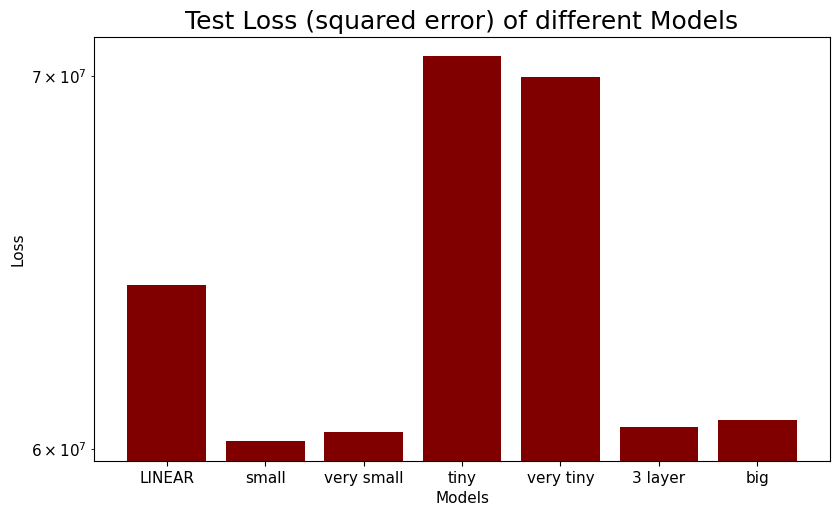

In [86]:
plt.bar(comparative_loss_test.keys(), comparative_loss_test.values(), color ='maroon')
plt.rcParams['font.size'] = 15
plt.xlabel('Models')
plt.ylabel('Loss')
plt.title('Test Loss (squared error) of different Models')
plt.yscale('log')
plt.show()

Plot the predictions and targets of a given model:

In [119]:
def test_model_name_plot_res(model, name):
    model.to("cpu")
    running_loss_sq = 0
    running_loss = 0
    predictions = []
    targets = []
    errors = []
    for i in range(len(x_test)):
        output = model(torch.tensor(x_test_np[i], dtype=torch.float32))

        predictions.append(output.item())
        targets.append(y_test[i])
        errors.append(abs(y_test[i] - output.item())/y_test[i])
        # Compute the loss
        loss = loss_fn(output, torch.tensor(y_test[i], dtype=torch.float32))
      
        running_loss_sq += loss.item()
        running_loss += abs(output - y_test[i])
    
    plt.scatter(range(len(targets)), targets, color='red', alpha=1, label="target")
    #plt.scatter(range(len(errors)), errors, color="green", alpha=0.2, label="error")
    plt.scatter(range(len(predictions)), predictions, color='blue', alpha=1, label="prediction")
    plt.legend()
    plt.yscale('log')
    plt.xlabel("Datapoint in Test Set")
    plt.ylabel("Number of Shares")
    plt.show()
    plt.close()
    print(errors)
    plt.yscale('log')
    plt.scatter(range(len(errors)), errors, color="green", alpha=1, label="error")

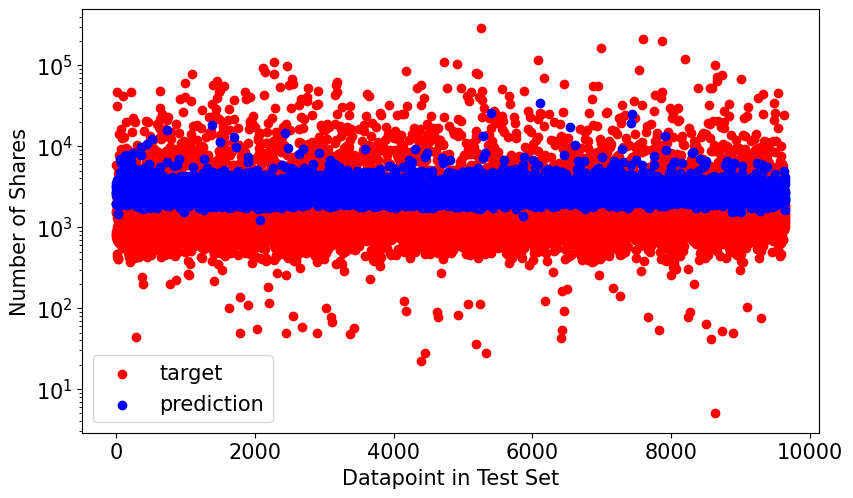

[2.701649754268484, 1.3738128255208333, 1.2090948063723752, 0.34775787353515625, 0.5917603759765625, 0.6677633201469809, 2.158634391373503, 0.7057855224609375, 2.324460968257874, 4.457706378831924, 0.6996978081597223, 1.5719423828125, 4.531854106104651, 0.6554784094769022, 1.1018811848958334, 1.0061283434851696, 0.9579148893779731, 0.8965675907556191, 2.7328034475948035, 1.655615234375, 3.3716489385932946, 3.7878616726382295, 1.770513045953912, 1.9041574857873285, 0.5524649711277174, 1.2460280354817708, 7.464890864857456, 0.8747366768973214, 2.29218896484375, 1.2193892728365385, 0.861822509765625, 4.760708815759892, 0.4786725079571759, 7.951799835727384, 1.3246428888494317, 0.46790976778858256, 4.107964902935606, 2.5790975645640013, 0.34353659237132356, 0.46449226754610656, 0.18307807074652777, 1.160546875, 0.5052571614583333, 0.6516137061181007, 1.4291117037259615, 1.0027467698317307, 0.5535026041666666, 1.8371183171730896, 0.7130272071678322, 0.162241455078125, 0.7908082411024305, 1.

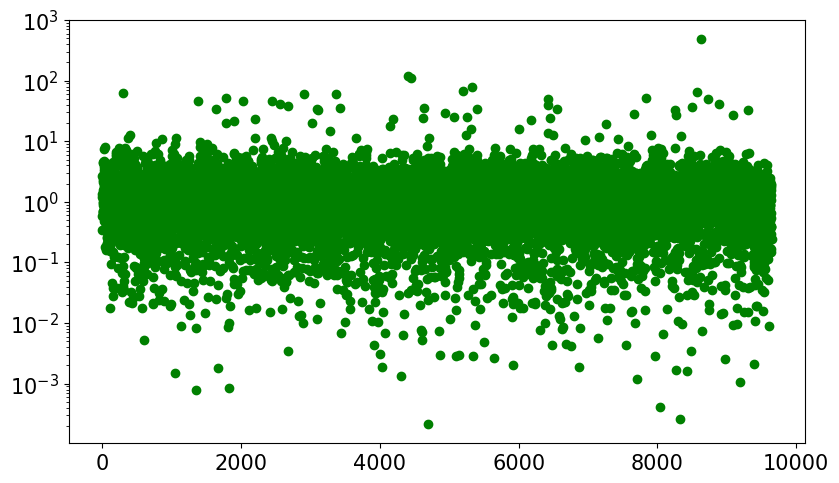

In [120]:
test_model_name_plot_res(modelSmall, "small")